In [2]:
import keras
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.signal import butter, filtfilt ,iirnotch
import seaborn as sns

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, LSTM, BatchNormalization, Conv1D, MaxPooling1D, Flatten
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model
from tensorflow import keras
from tensorflow.keras import layers

from sklearn.utils import resample
from sklearn.ensemble import RandomForestClassifier , VotingClassifier
from sklearn.preprocessing import StandardScaler , LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import svm

from darts import TimeSeries
from darts.dataprocessing.transformers import Scaler
import torch



In [3]:
# مسیر پوشه
folder = r"C:\Users\AERO\Downloads\Video\05_فصل پنجم Timeseries Classifications\projects\project\dataset hb"

# خواندن فایل‌ها
train_path = os.path.join(folder, "mitbih_train.csv")
test_path = os.path.join(folder, "mitbih_test.csv")
abnormal_path = os.path.join(folder, "ptbdb_abnormal.csv")
normal_path = os.path.join(folder, "ptbdb_normal.csv")

train_dataset  = pd.read_csv(train_path)
test_dataset  = pd.read_csv(test_path)
df_abnormal = pd.read_csv(abnormal_path)
df_normal = pd.read_csv(normal_path)

In [4]:
import pandas as pd

label_col = train_dataset.columns[-1]  # آخرین ستون
print("نام ستون برچسب (کلاس):", label_col)
print("مقادیر یکتا (کلاس‌های مختلف):", train_dataset[label_col].unique())
print("تعداد هر کلاس:")
print(train_dataset[label_col].value_counts())


نام ستون برچسب (کلاس): 0.000000000000000000e+00.88
مقادیر یکتا (کلاس‌های مختلف): [0. 1. 2. 3. 4.]
تعداد هر کلاس:
0.000000000000000000e+00.88
0.0    72470
4.0     6431
2.0     5788
1.0     2223
3.0      641
Name: count, dtype: int64


چون نام ستون ها یکی نیست از کد پایینی استفاده نمیکنم ولی بد نیست بدانید که از روش زیر می توان استفاده کرد

۱. یکسان‌سازی اسامی ستون‌ها
اگر ستون‌ها به ترتیب منطقی در هر دو دیتاست هستند و تفاوت فقط در اسم است، می‌توانی نام همه را یکی کنی.
مثلاً همه را به شکل col_0, col_1, ... تغییر بده:

۲. فقط ستون‌های مشترک را نگه دار
اگر نمی‌خوای ترتیب ستون‌ها رو به خطر بندازی و مطمئنی فقط ستون‌های مشترک رو لازم داری:

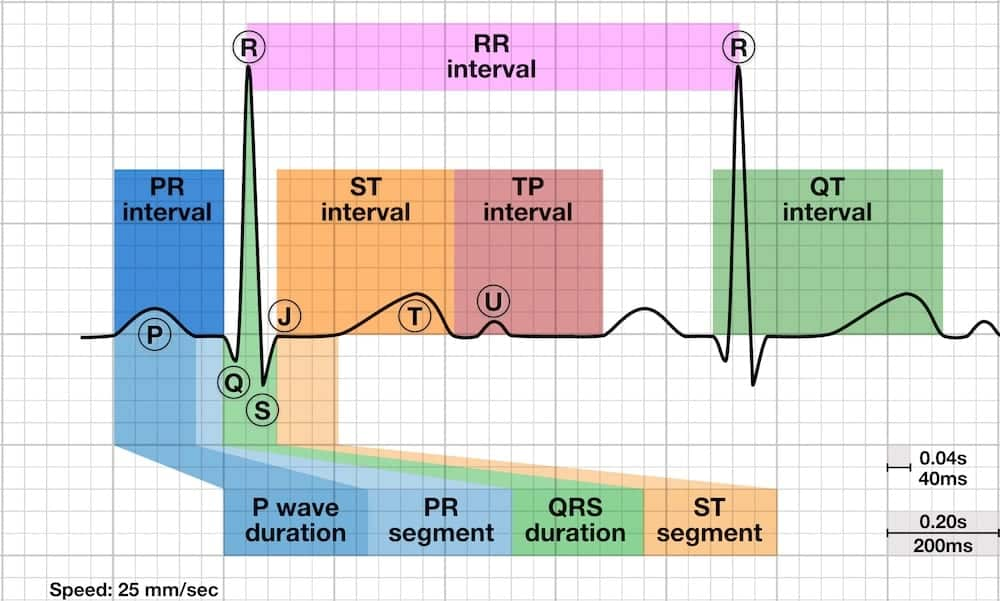
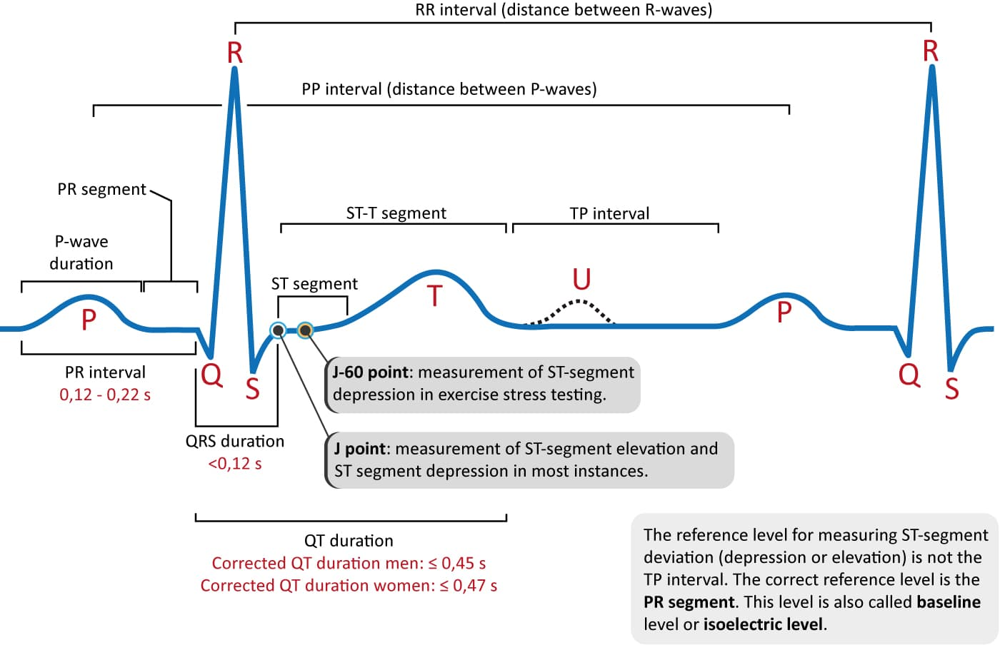

In [9]:
print(os.listdir('C:/Users/AERO/Downloads/Video/05_فصل پنجم Timeseries Classifications/projects/project/dataset hb'))

['mitbih_test.csv', 'mitbih_train.csv', 'ptbdb_abnormal.csv', 'ptbdb_normal.csv']


## plots

In [11]:
nRowsRead = 1000 # specify 'None' if want to read whole file
# mitbih_test.csv has 21891 rows in reality, but we are only loading/previewing the first 1000 rows
df1 = pd.read_csv(test_path, delimiter=',', nrows = nRowsRead)
df1.dataframeName = 'mitbih_test.csv'
nRow, nCol = df1.shape
print(f'There are {nRow} rows and {nCol} columns')

There are 1000 rows and 188 columns


In [12]:
df1.head(10)

,1.000000000000000000e+00,7.582644820213317871e-01,1.115702465176582336e-01,0.000000000000000000e+00,8.057851344347000122e-02,7.851240038871765137e-02,6.611569970846176147e-02,4.958677664399147034e-02,4.752065986394882202e-02,3.512396663427352905e-02,...,0.000000000000000000e+00.56,0.000000000000000000e+00.57,0.000000000000000000e+00.58,0.000000000000000000e+00.59,0.000000000000000000e+00.60,0.000000000000000000e+00.61,0.000000000000000000e+00.62,0.000000000000000000e+00.63,0.000000000000000000e+00.64,0.000000000000000000e+00.65
0,0.908425,0.783883,0.531136,0.362637,0.366300,0.344322,0.333333,0.307692,0.296703,0.300366,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.730088,0.212389,0.000000,0.119469,0.101770,0.101770,0.110619,0.123894,0.115044,0.132743,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.000000,0.910417,0.681250,0.472917,0.229167,0.068750,0.000000,0.004167,0.014583,0.054167,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.570470,0.399329,0.238255,0.147651,0.000000,0.003356,0.040268,0.080537,0.070470,0.090604,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.000000,0.923664,0.656489,0.195929,0.111959,0.175573,0.122137,0.050891,0.035623,0.055980,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,1.000000,0.797260,0.320548,0.043836,0.049315,0.065753,0.030137,0.008219,0.005479,0.010959,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.909408,0.975610,0.533101,0.134146,0.066202,0.000000,0.010453,0.012195,0.031359,0.146341,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.927803,0.866359,0.299539,0.000000,0.231951,0.317972,0.274962,0.262673,0.270353,0.268817,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,1.000000,0.914230,0.473684,0.000000,0.064327,0.317739,0.405458,0.391813,0.382066,0.401559,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.997429,0.861183,0.365039,0.071979,0.082262,0.100257,0.074550,0.051414,0.051414,0.043702,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [13]:
# Distribution graphs (histogram/bar graph) of column data
def plotPerColumnDistribution(df, nGraphShown, nGraphPerRow):
    nunique = df.nunique()
    df = df[[col for col in df if nunique[col] > 1 and nunique[col] < 50]]  # Pick columns with 1-50 unique values
    nRow, nCol = df.shape
    columnNames = list(df)
    
    # Calculate number of rows and columns
    nGraphRow = math.ceil(nCol / nGraphPerRow)  # Make sure nGraphRow is an integer
    
    # Set up the figure with a dynamic size
    plt.figure(num=None, figsize=(6 * nGraphPerRow, 8 * nGraphRow), dpi=80, facecolor='w', edgecolor='k')
    
    for i in range(min(nCol, nGraphShown)):
        plt.subplot(nGraphRow, nGraphPerRow, i + 1)  # This is where the error occurred before
        columnDf = df.iloc[:, i]
        
        if not np.issubdtype(type(columnDf.iloc[0]), np.number):  # If not numeric
            valueCounts = columnDf.value_counts()
            valueCounts.plot.bar()
        else:  # If numeric
            columnDf.hist()
        
        plt.ylabel('counts')
        plt.xticks(rotation=90)
        plt.title(f'{columnNames[i]} (column {i})')
    
    plt.tight_layout(pad=1.0, w_pad=1.0, h_pad=1.0)
    plt.show()

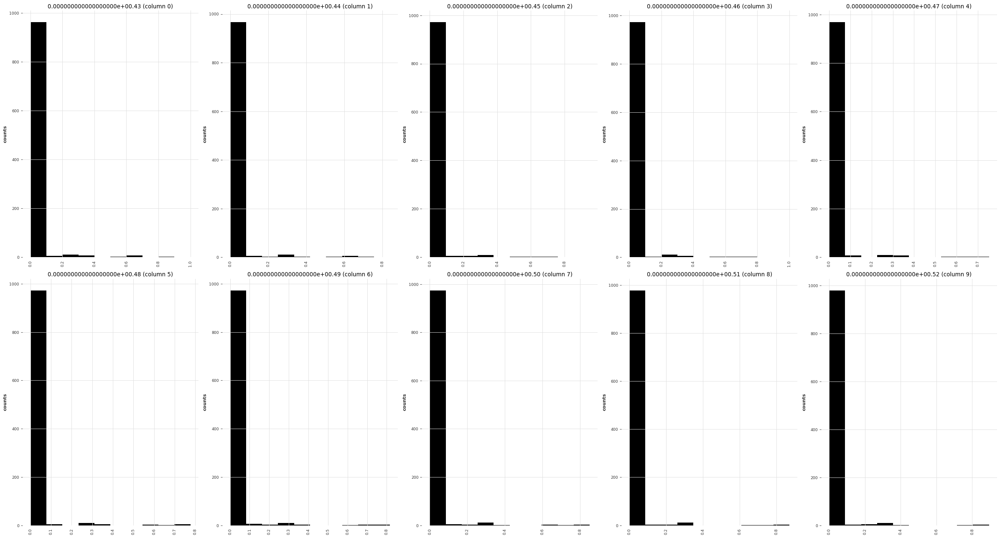

In [14]:
plotPerColumnDistribution(df1, 10, 5)


تصویری که ارسال کرده‌اید به نظر می‌رسد مربوط به نمودارهای **هیستوگرام** برای ویژگی‌های مختلف یک دیتاست باشد. از آنجا که هر کدام از این نمودارها مربوط به یک ستون از دیتاست است، این نشان می‌دهد که توزیع مقادیر هر ستون از داده‌ها را نشان می‌دهد.

### توضیحات:

* **هیستوگرام‌ها** به‌طور خاص برای نمایش توزیع داده‌ها استفاده می‌شوند. در اینجا، محور عمودی (y) نشان‌دهنده تعداد وقوع مقادیر مختلف در هر ستون است و محور افقی (x) مقادیر مختلف ستون‌ها را نشان می‌دهد.
* به‌نظر می‌رسد که بیشتر داده‌ها در **نزدیکی صفر** متمرکز شده‌اند و فقط تعداد کمی از مقادیر از صفر فاصله دارند. این نشان می‌دهد که این ستون‌ها یا مقادیر متنوعی ندارند یا بسیار کم‌اند.

در مجموع، این نمودارها نشان‌دهنده داده‌هایی هستند که مقدار زیادی از آنها برابر با صفر است (که به‌نظر می‌رسد تکرار زیادی دارند) و فقط مقادیر اندکی از آن‌ها مقادیر دیگری (کمتر از 1) را نشان می‌دهند.

این می‌تواند به این معنا باشد که داده‌ها از یک **دسته‌بندی باینری** یا مقادیر خاص (مثل 0 و 1) تشکیل شده‌اند.

### سوالات احتمالی:

1. **چرا بیشتر داده‌ها صفر هستند؟**

   * ممکن است در این ستون‌ها بیشتر داده‌ها به‌طور پیش‌فرض یا به دلایل خاصی صفر باشند.
2. **چگونه می‌توانم این داده‌ها را تحلیل کنم؟**

   * بسته به هدف شما، ممکن است نیاز به پاک‌سازی داده‌ها یا تمرکز بر ویژگی‌هایی که متنوع‌تر هستند داشته باشید.


In [16]:
# Correlation matrix
def plotCorrelationMatrix(df, graphWidth):
    filename = df.dataframeName
    df = df.dropna(axis='columns')  # drop columns with NaN
    df = df[[col for col in df if df[col].nunique() > 1]]  # keep columns where there are more than 1 unique values
    if df.shape[1] < 2:
        print(f'No correlation plots shown: The number of non-NaN or constant columns ({df.shape[1]}) is less than 2')
        return
    corr = df.corr()
    plt.figure(num=None, figsize=(graphWidth, graphWidth), dpi=80, facecolor='w', edgecolor='k')
    corrMat = plt.matshow(corr, fignum=1)
    plt.xticks(range(len(corr.columns)), corr.columns, rotation=90)
    plt.yticks(range(len(corr.columns)), corr.columns)
    plt.gca().xaxis.tick_bottom()
    plt.colorbar(corrMat)
    plt.title(f'Correlation Matrix for {filename}', fontsize=15)
    plt.show()

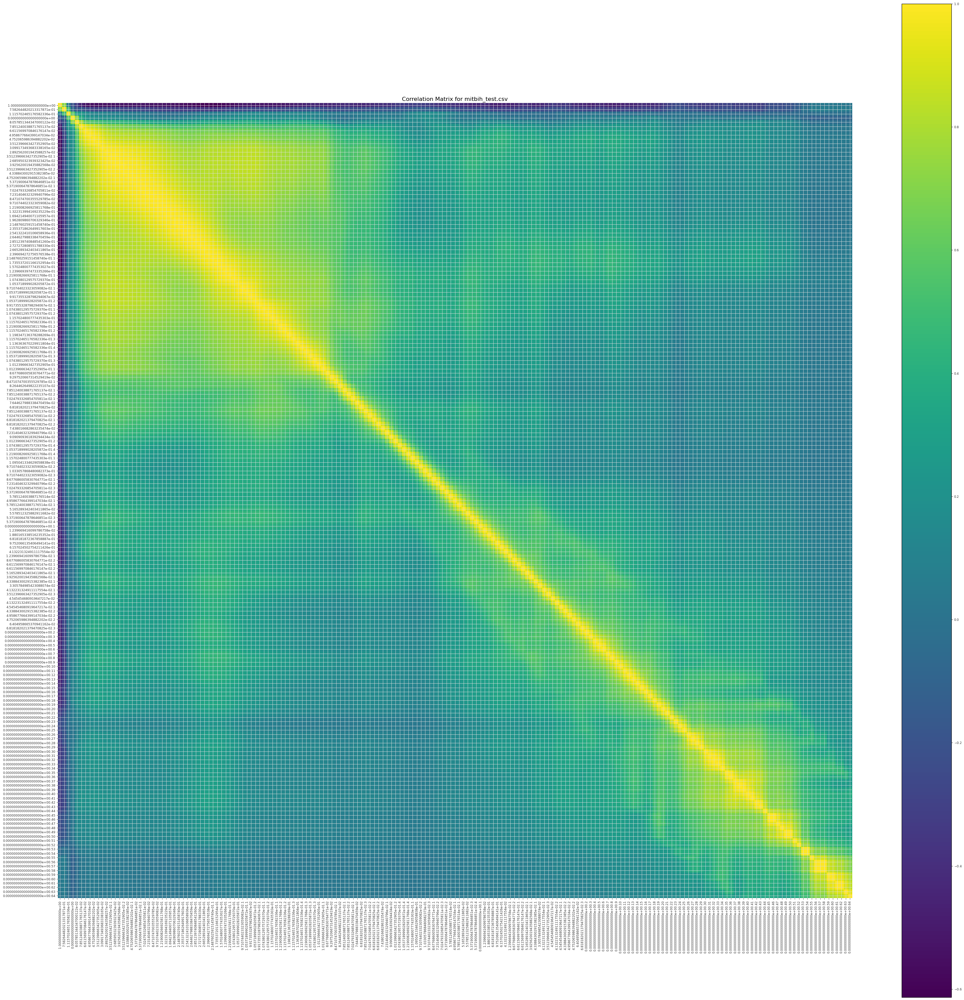

In [17]:
plotCorrelationMatrix(df1, 47)

In [18]:
# Scatter and density plots
def plotScatterMatrix(df, plotSize, textSize):
    df = df.select_dtypes(include =[np.number]) # keep only numerical columns
    # Remove rows and columns that would lead to df being singular
    df = df.dropna(axis='columns')
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    columnNames = list(df)
    if len(columnNames) > 10: # reduce the number of columns for matrix inversion of kernel density plots
        columnNames = columnNames[:10]
    df = df[columnNames]
    ax = pd.plotting.scatter_matrix(df, alpha=0.75, figsize=[plotSize, plotSize], diagonal='kde')
    corrs = df.corr().values
    for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
        ax[i, j].annotate('Corr. coef = %.3f' % corrs[i, j], (0.8, 0.2), xycoords='axes fraction', ha='center', va='center', size=textSize)
    plt.suptitle('Scatter and Density Plot')
    plt.show()

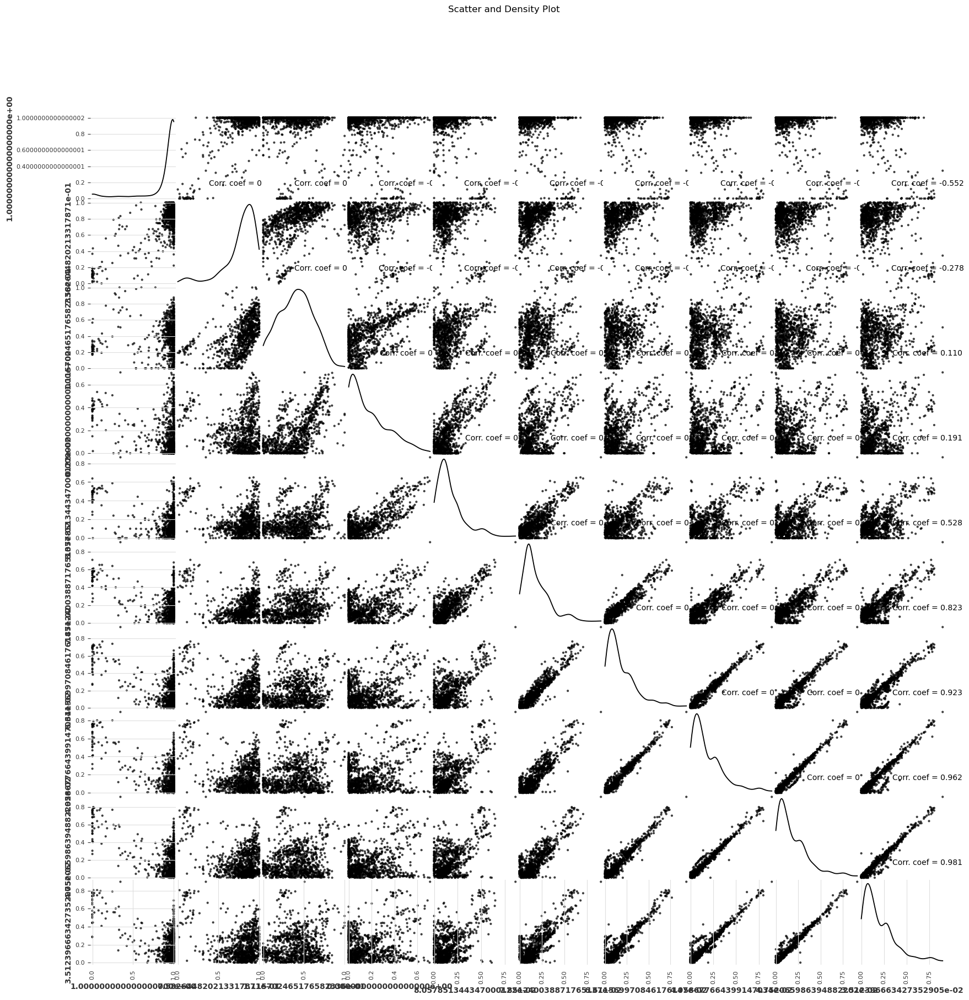

In [19]:
plotScatterMatrix(df1, 20, 10)

تصویر جدید که ارسال کرده‌اید، به نظر می‌رسد که یک **ماتریس پراکندگی** (scatter plot matrix) است که در آن رابطه بین چندین ویژگی از داده‌ها نمایش داده شده است. هر جعبه در این ماتریس یک نمودار پراکندگی (scatter plot) است که دو ویژگی مختلف از داده‌ها را در مقابل هم قرار می‌دهد. این نمودارها برای تحلیل همبستگی و روابط بین ویژگی‌ها استفاده می‌شوند.

### ویژگی‌های اصلی این نمودار:

1. **پراکندگی و چگالی**: در هر جعبه نمودار، به‌طور همزمان هر دو ویژگی به‌عنوان داده‌های پراکنده نمایش داده می‌شوند و خط چگالی نیز به آن اضافه شده است.
2. **ضریب همبستگی**: در هر جعبه، ضریب همبستگی (correlation coefficient) بین دو ویژگی که نمودار پراکندگی آن‌ها نمایش داده شده است، نوشته شده است. این عدد نشان‌دهنده میزان همبستگی بین آن دو ویژگی است:

   * **ضریب همبستگی نزدیک به 1**: نشان‌دهنده همبستگی مثبت قوی.
   * **ضریب همبستگی نزدیک به -1**: نشان‌دهنده همبستگی منفی قوی.
   * **ضریب همبستگی نزدیک به 0**: نشان‌دهنده عدم همبستگی بین ویژگی‌ها.
3. **محورهای اصلی**: در هر جعبه‌ای که نمودار پراکندگی وجود دارد، نمودار چگالی (density plot) نیز به‌طور جداگانه برای هر ویژگی نمایش داده شده است که توزیع داده‌ها را نشان می‌دهد.

### هدف استفاده از چنین نمودارهایی:

* **شناسایی همبستگی‌ها**: این نمودار به شما کمک می‌کند که ببینید کدام ویژگی‌ها با هم همبستگی مثبت یا منفی دارند.
* **بررسی توزیع داده‌ها**: نمودار چگالی توزیع داده‌ها را برای هر ویژگی نشان می‌دهد و می‌تواند به شما کمک کند که آیا داده‌ها نرمال هستند یا خیر.

In [21]:
nRowsRead = 1000 # specify 'None' if want to read whole file
# mitbih_train.csv has 87553 rows in reality, but we are only loading/previewing the first 1000 rows
df2 = pd.read_csv(train_path, delimiter=',', nrows = nRowsRead)
df2.dataframeName = 'mitbih_train.csv'
nRow, nCol = df2.shape
print(f'There are {nRow} rows and {nCol} columns')

There are 1000 rows and 188 columns


In [22]:
df2.head(5)

,9.779411554336547852e-01,9.264705777168273926e-01,6.813725233078002930e-01,2.450980395078659058e-01,1.544117629528045654e-01,1.911764740943908691e-01,1.519607901573181152e-01,8.578431606292724609e-02,5.882352963089942932e-02,4.901960864663124084e-02,...,0.000000000000000000e+00.79,0.000000000000000000e+00.80,0.000000000000000000e+00.81,0.000000000000000000e+00.82,0.000000000000000000e+00.83,0.000000000000000000e+00.84,0.000000000000000000e+00.85,0.000000000000000000e+00.86,0.000000000000000000e+00.87,0.000000000000000000e+00.88
0,0.960114,0.863248,0.461538,0.196581,0.094017,0.125356,0.099715,0.088319,0.074074,0.082621,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.000000,0.659459,0.186486,0.070270,0.070270,0.059459,0.056757,0.043243,0.054054,0.045946,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.925414,0.665746,0.541436,0.276243,0.196133,0.077348,0.071823,0.060773,0.066298,0.058011,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.967136,1.000000,0.830986,0.586854,0.356808,0.248826,0.145540,0.089202,0.117371,0.150235,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.927461,1.000000,0.626943,0.193437,0.094991,0.072539,0.043178,0.053541,0.093264,0.189983,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


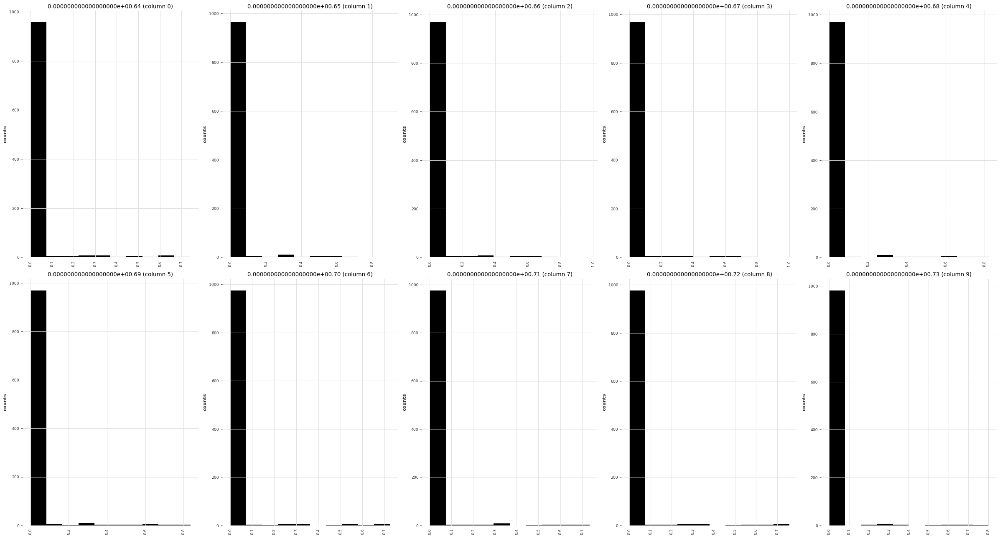

In [24]:
plotPerColumnDistribution(df2, 10, 5)

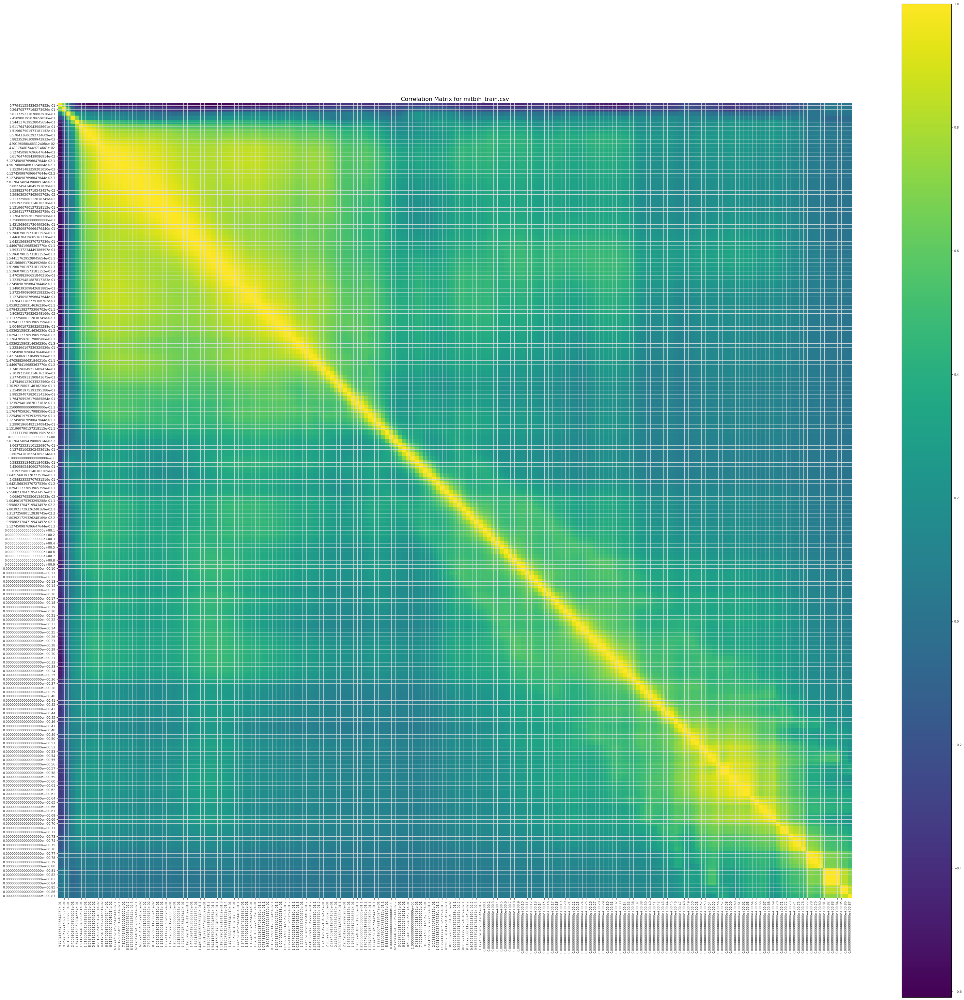

In [25]:
plotCorrelationMatrix(df2, 47)

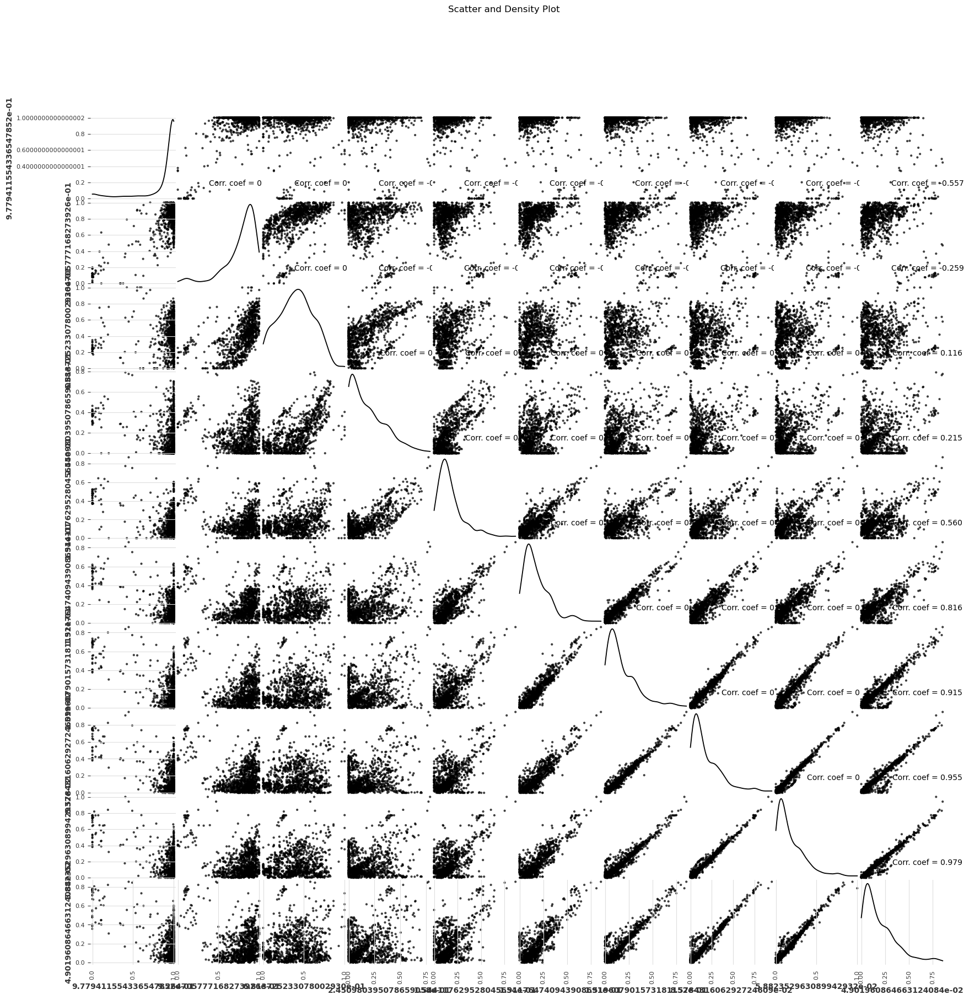

In [41]:
plotScatterMatrix(df2, 20, 10)

In [42]:
nRowsRead = 1000 # specify 'None' if want to read whole file
# ptbdb_abnormal.csv has 10505 rows in reality, but we are only loading/previewing the first 1000 rows
df3 = pd.read_csv(abnormal_path, delimiter=',', nrows = nRowsRead)
df3.dataframeName = 'ptbdb_abnormal.csv'
nRow, nCol = df3.shape
print(f'There are {nRow} rows and {nCol} columns')

There are 1000 rows and 188 columns


In [43]:
df3.head(5)

,9.322328567504882812e-01,8.696785569190979004e-01,8.861859440803527832e-01,9.296264052391052246e-01,9.087749719619750977e-01,9.339704513549804688e-01,8.010425567626953125e-01,7.497828006744384766e-01,6.872285008430480957e-01,6.350998878479003906e-01,...,0.000000000000000000e+00.117,0.000000000000000000e+00.118,0.000000000000000000e+00.119,0.000000000000000000e+00.120,0.000000000000000000e+00.121,0.000000000000000000e+00.122,0.000000000000000000e+00.123,0.000000000000000000e+00.124,0.000000000000000000e+00.125,1.000000000000000000e+00.1
0,1.000000,0.606941,0.384181,0.254237,0.223567,0.276836,0.253430,0.184826,0.153349,0.121872,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,1.000000,0.951613,0.923963,0.853303,0.791859,0.734255,0.672043,0.685100,0.670507,0.667435,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.977819,0.899261,0.230129,0.032348,0.142329,0.223660,0.328096,0.367837,0.381701,0.389094,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.935618,0.801661,0.805815,1.000000,0.722741,0.480789,0.454829,0.319834,0.266874,0.308411,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.925265,0.433352,0.073620,0.079197,0.136643,0.182934,0.182934,0.182376,0.196877,0.203569,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


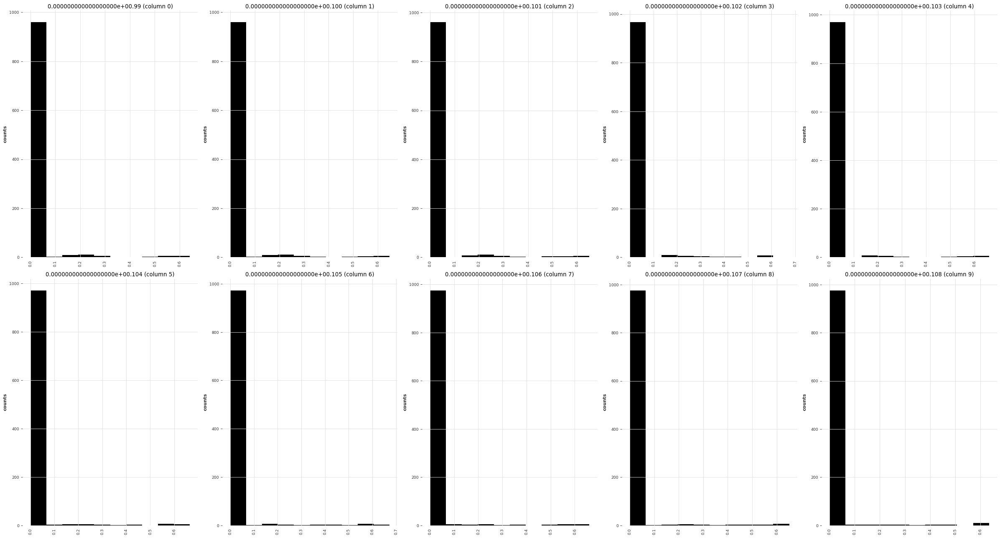

In [47]:
plotPerColumnDistribution(df3, 10, 5)

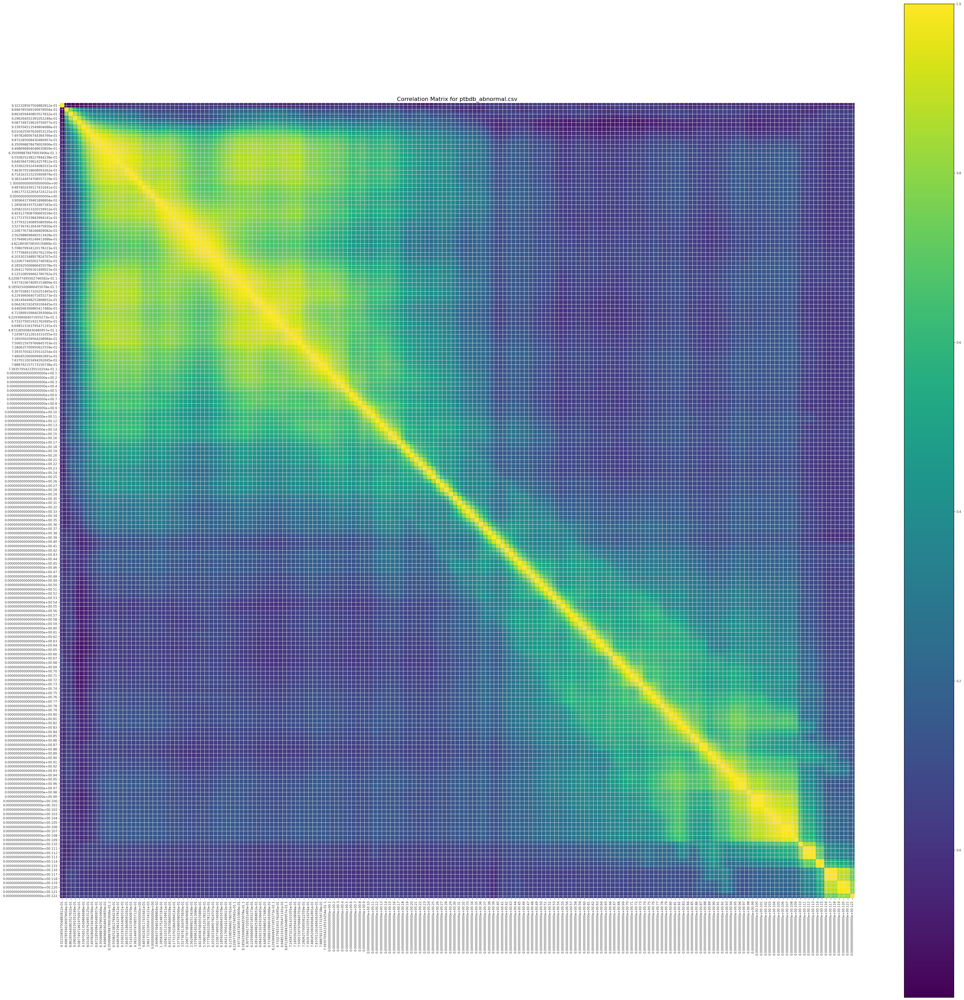

In [48]:
plotCorrelationMatrix(df3, 47)

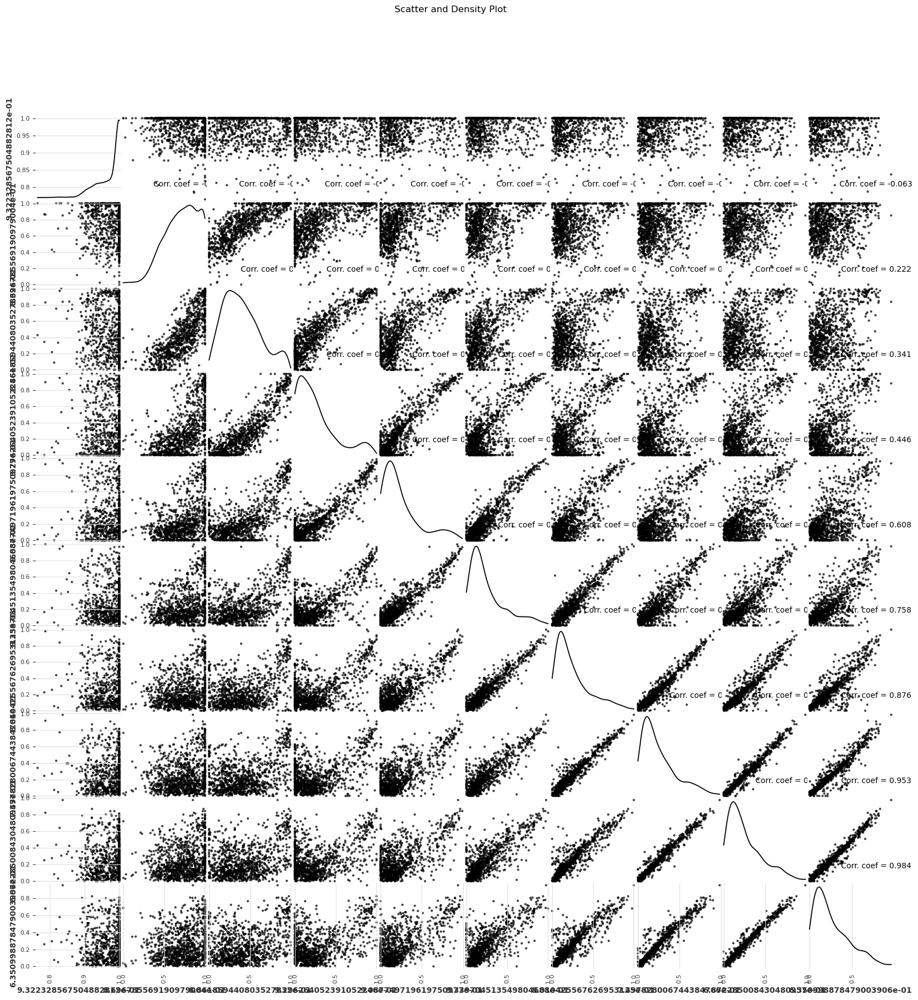

In [50]:
plotScatterMatrix(df3, 20, 10)

## Importing the dataset

In [53]:
train_dataset = pd.read_csv(os.path.join(folder, 'mitbih_train.csv'), header=None)
test_dataset = pd.read_csv(os.path.join(folder, 'mitbih_test.csv'), header=None)

In [54]:
# train dataset
train_dataset.head()

,0,1,2,3,4,5,6,7,8,9,...,178,179,180,181,182,183,184,185,186,187
0,0.977941,0.926471,0.681373,0.245098,0.154412,0.191176,0.151961,0.085784,0.058824,0.049020,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.960114,0.863248,0.461538,0.196581,0.094017,0.125356,0.099715,0.088319,0.074074,0.082621,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.000000,0.659459,0.186486,0.070270,0.070270,0.059459,0.056757,0.043243,0.054054,0.045946,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.925414,0.665746,0.541436,0.276243,0.196133,0.077348,0.071823,0.060773,0.066298,0.058011,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.967136,1.000000,0.830986,0.586854,0.356808,0.248826,0.145540,0.089202,0.117371,0.150235,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## see our data 

In [56]:
target_column_index = train_dataset.shape[1] - 1
class_labels = train_dataset[target_column_index].unique()

In [57]:
class_labels

array([0., 1., 2., 3., 4.])

In [58]:
labels = [
    'Normal Beat',
    'Supraventricular premature beat',
    'Premature ventricular contraction',
    'Fusion of ventricular and normal beat',
    'Unclassifiable beat'
]

In [60]:
for label in class_labels:
    print(f"Class label {int(label)}: {labels[int(label)]}")

Class label 0: Normal Beat
Class label 1: Supraventricular premature beat
Class label 2: Premature ventricular contraction
Class label 3: Fusion of ventricular and normal beat
Class label 4: Unclassifiable beat


In [61]:
# Nan percentages of the columns
null_col = train_dataset.isna().mean() * 100
print(null_col)

0      0.0
1      0.0
2      0.0
3      0.0
4      0.0
      ... 
183    0.0
184    0.0
185    0.0
186    0.0
187    0.0
Length: 188, dtype: float64


In [62]:
label_col = train_dataset.columns[-1]
num_of_values = train_dataset[label_col].astype(float).value_counts()
num_of_values

187
0.0    72471
4.0     6431
2.0     5788
1.0     2223
3.0      641
Name: count, dtype: int64

In [63]:
# ساخت لیست درصدها طبق ترتیب درست کلاس‌ها
counts = [
    num_of_values.get(0.0, 0),
    num_of_values.get(1.0, 0),
    num_of_values.get(2.0, 0),
    num_of_values.get(3.0, 0),
    num_of_values.get(4.0, 0)
]
# درست کردن DataFrame با ترتیب درست
data_for_plot = pd.DataFrame({
    'Label': labels,
    'Count': counts
})


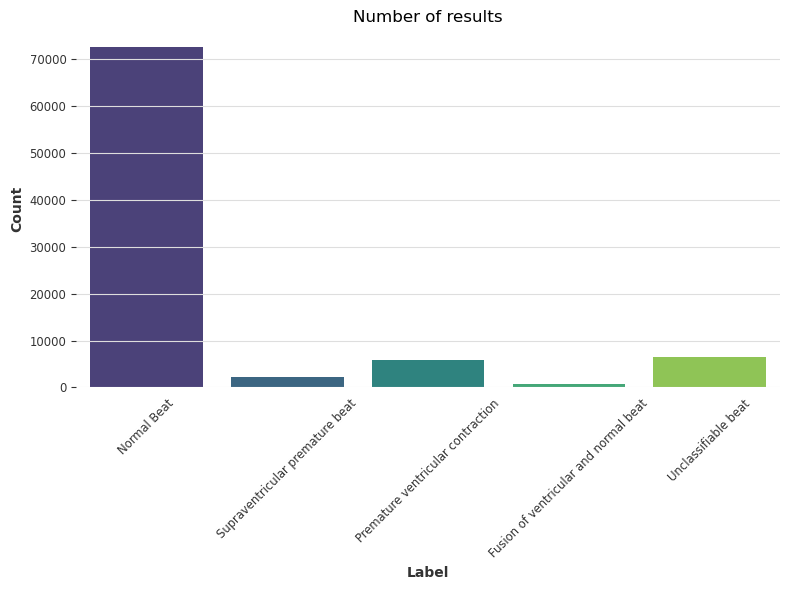

In [64]:
plt.figure(figsize=(8, 6))
plt.title("Number of results")
sns.barplot(data=data_for_plot, x='Label', y='Count', hue='Label', palette='viridis',dodge=False)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

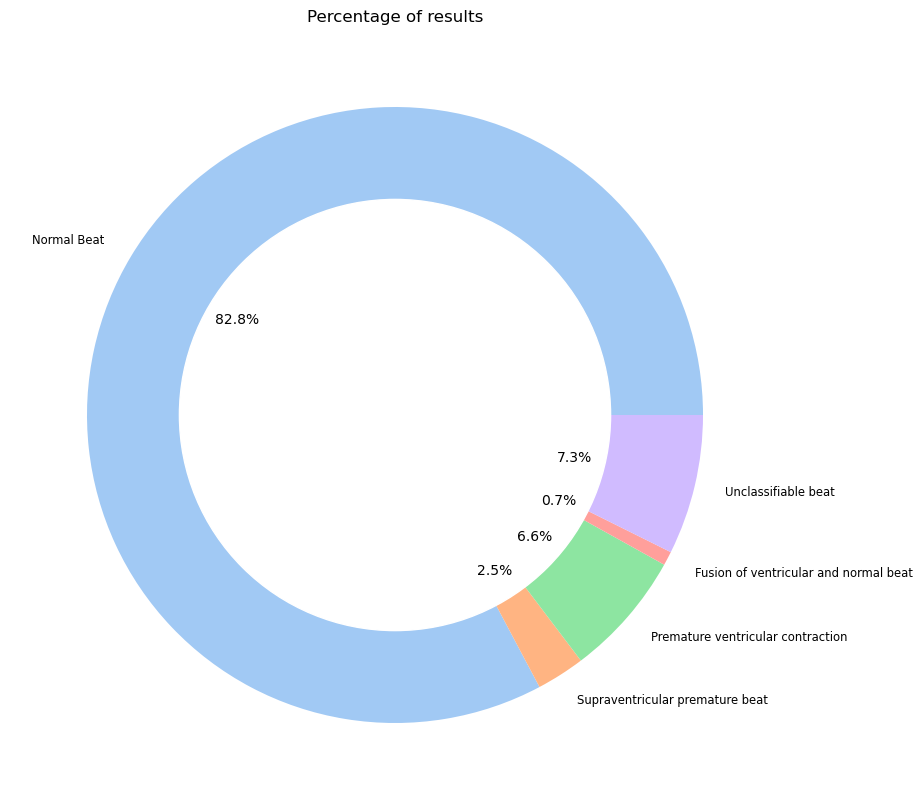

In [70]:
plt.figure(figsize=(20,10))
plt.title("Percentage of results")
my_circle=plt.Circle((0,0), 0.7, color='white')
plt.pie(counts, labels=labels, autopct='%1.1f%%', colors=sns.color_palette('pastel'))
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

In [76]:
label_col = test_dataset.columns[-1]
num_of_values_test = test_dataset[label_col].astype(float).value_counts()
num_of_values_test

187
0.0    18118
4.0     1608
2.0     1448
1.0      556
3.0      162
Name: count, dtype: int64

In [79]:
train_dataset.shape # 87554 ones, 188 columns

(87554, 188)

In [81]:
test_dataset.shape # 21892 ones, 188 columns

(21892, 188)

## upsample

#### ایحاد توازن برای هر کلاس داده تا به یک مقدار از هر کلاس داده داشته باشیم با ساختن داده های تصادفی 

In [85]:
label_col = train_dataset.columns[-1]  # نام آخرین ستون (برچسب)

In [87]:
df_1 = train_dataset[train_dataset[label_col] == 1]
df_2 = train_dataset[train_dataset[label_col] == 2]
df_3 = train_dataset[train_dataset[label_col] == 3]
df_4 = train_dataset[train_dataset[label_col] == 4]

In [89]:
df_1_upsample = resample(df_1, n_samples = 20000, replace = True, random_state = 123)
df_2_upsample = resample(df_2, n_samples = 20000, replace = True, random_state = 123)
df_3_upsample = resample(df_3, n_samples = 20000, replace = True, random_state = 123)
df_4_upsample = resample(df_4, n_samples = 20000, replace = True, random_state = 123)
df_0 = train_dataset[train_dataset[label_col]==0].sample(n =20000, random_state=123)

train_dataset = pd.concat([df_0, df_1_upsample, df_2_upsample, df_3_upsample, df_4_upsample])

In [91]:
train_dataset.shape # Now we have 20000 samples each class

(100000, 188)

## now do this for test 

In [94]:
df_1_test = test_dataset[test_dataset[label_col] == 1]
df_2_test = test_dataset[test_dataset[label_col] == 2]
df_3_test = test_dataset[test_dataset[label_col] == 3]
df_4_test = test_dataset[test_dataset[label_col] == 4]

In [96]:
df_1_upsample_test = resample(df_1_test, n_samples = 5000, replace = True, random_state = 123)
df_2_upsample_test = resample(df_2_test, n_samples = 5000, replace = True, random_state = 123)
df_3_upsample_test = resample(df_3_test, n_samples = 5000, replace = True, random_state = 123)
df_4_upsample_test = resample(df_4_test, n_samples = 5000, replace = True, random_state = 123)
df_0_test = test_dataset[test_dataset[label_col]==0].sample(n =5000, random_state=123)

test_dataset = pd.concat([df_0_test, df_1_upsample_test, df_2_upsample_test, df_3_upsample_test, df_4_upsample_test])

In [98]:
test_dataset.shape # In test dataset we have 5000 each class

(25000, 188)

In [100]:
num_of_values = train_dataset[label_col].value_counts()

In [102]:
num_of_values

187
0.0    20000
1.0    20000
2.0    20000
3.0    20000
4.0    20000
Name: count, dtype: int64

In [104]:
data_for_plot = pd.DataFrame({'Label': labels, 'Count': num_of_values.values})

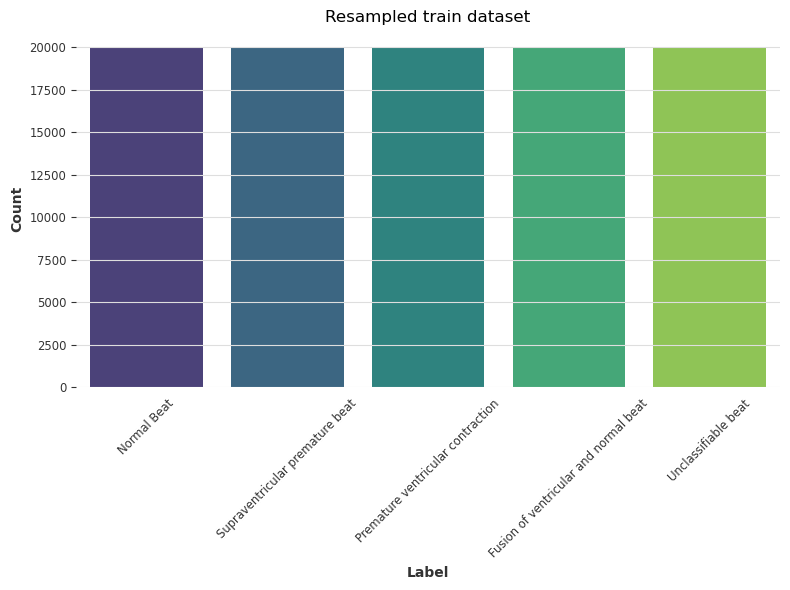

In [106]:
plt.figure(figsize=(8, 6))
plt.title("Resampled train dataset")
sns.barplot(data=data_for_plot, x='Label', y='Count', hue='Label', palette='viridis',dodge=False)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

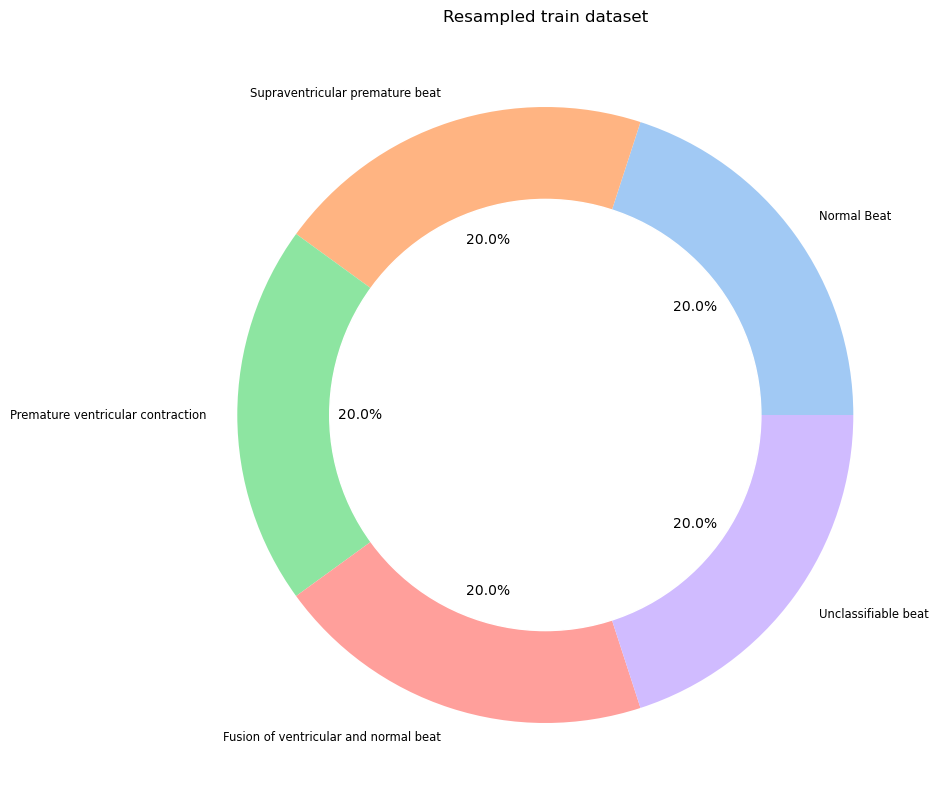

In [108]:
plt.figure(figsize=(20,10))
plt.title("Resampled train dataset")
my_circle=plt.Circle( (0,0), 0.7, color='white')
plt.pie(num_of_values.values, labels=labels, autopct='%1.1f%%', colors=sns.color_palette('pastel'))
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

## Preprocessing

In [111]:
X_train = train_dataset.iloc[:, :-1].values
y_train = train_dataset.iloc[:, -1].values

In [113]:
X_train.shape

(100000, 187)

In [115]:
X_train[:, 5]

array([0.06345733, 0.06761566, 0.16049382, ..., 0.59348035, 0.57711953,
       0.62658226])

In [117]:
X_test = test_dataset.iloc[:, :-1].values
y_test = test_dataset.iloc[:, -1].values

### هدف: حذف نویزهای فرکانس بالا از سیگنال ECG

In [120]:
ecg_data = train_dataset
ecg_signal_train = X_train
ecg_signal_test = X_test
class_labels = y_train


def butter_lowpass_filter(data, cutoff_freq, fs, order=5):
  """
  order: filter order (5 — smooth transition between passed and suppressed frequencies).
  """
  nyquist_freq = 0.5 * fs
  normal_cutoff = cutoff_freq / nyquist_freq
  b, a = butter(order, normal_cutoff, btype='low', analog=False) # creates Butterworth filter coefficients.
  filtered_data = filtfilt(b, a, data) #  applies a forward and reverse filter — so as not to distort the signal phase (important in ECG!).
  return filtered_data

In [122]:
sampling_rate = 125 # Sampling Frequency: 125Hz
cutoff_frequency = 50 # Cutoff frequency — anything above 50 Hz will be suppressed (considered noise).

train_filtered_ecg_signal = butter_lowpass_filter(data = ecg_signal_train, cutoff_freq = cutoff_frequency, fs = sampling_rate)
test_filtered_ecg_signal = butter_lowpass_filter(data = ecg_signal_test, cutoff_freq = cutoff_frequency, fs = sampling_rate)

نمایش چند مثال قبل و بعد

Indexes: [87352 48271  4062 42561 76614]


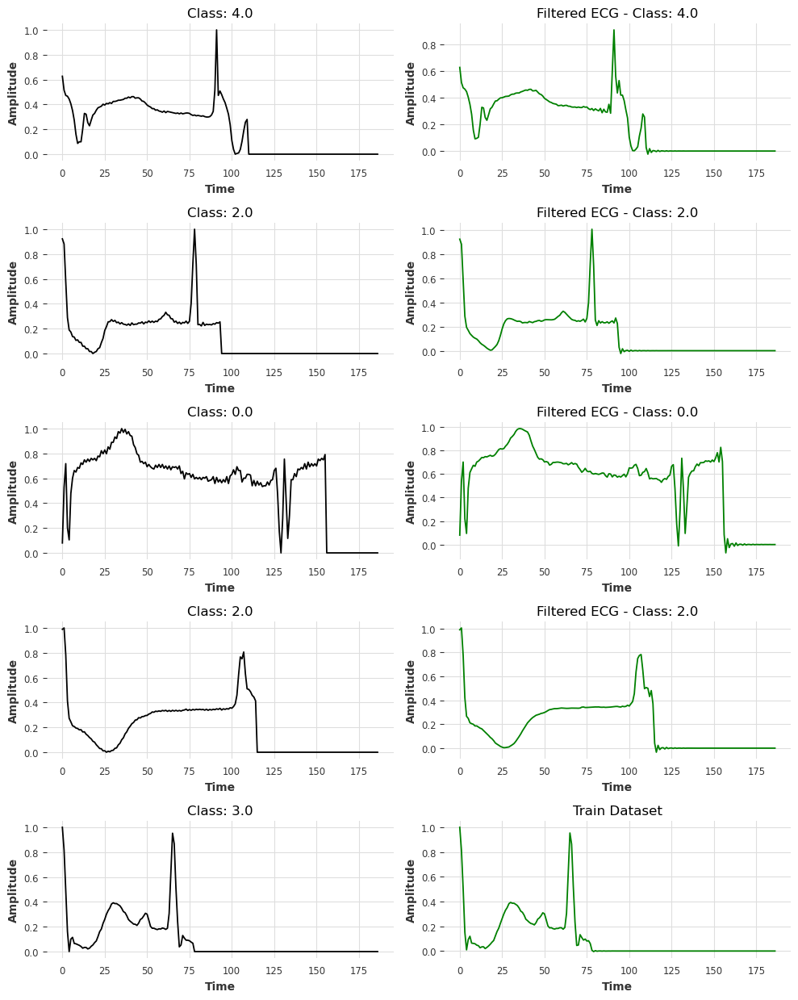

In [125]:
def plot_ecg_examples(raw_data, filtered_data, labels, numOfExamples=5):
  plt.figure(figsize=(10, numOfExamples*2.5))

  indices = np.random.choice(len(raw_data), numOfExamples, replace=False)
  print("Indexes:",indices)
  for i, idx in enumerate(indices):

    # Raw ECG
    plt.subplot(numOfExamples, 2, 2*i+1)
    plt.plot(raw_data[idx])
    plt.title(f'Class: {labels[idx]}')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.grid(True)

    # Filtered ECG
    plt.subplot(numOfExamples, 2, 2*i + 2)
    plt.plot(filtered_data[idx], color='green')
    plt.title(f'Filtered ECG - Class: {labels[idx]}')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.grid(True)

  plt.title("Train Dataset")
  plt.tight_layout()
  plt.show()
plot_ecg_examples(X_train, train_filtered_ecg_signal, y_train)

## اگر بازهم نویز داشت میتونی پایینی را هم استفاده کنی که در اینجا نیازی نیست

# StandardScaler

In [129]:
X_train, X_valid, y_train, y_valid = train_test_split(train_filtered_ecg_signal, y_train, test_size=0.2, random_state=42)

In [131]:
X_test = test_filtered_ecg_signal

In [133]:
scaler = StandardScaler()

X_train_normalized = scaler.fit_transform(X_train)
X_valid_normalized = scaler.transform(X_valid)
X_test_normalized = scaler.transform(X_test)

print("Before Normalization:")
print(X_train[:, 5])
print(f'\nBefore Mean : {X_train.mean()}, Std: {X_train.std()}')

print("\nAfter Normalization:")
print(X_train_normalized[:, 5])
print(f'\nBefore Mean : {X_train_normalized.mean()}, Std: {X_train_normalized.std()}')

Before Normalization:
[0.13364516 0.27257589 0.49405604 ... 0.19419107 0.17102655 0.13316612]

Before Mean : 0.1912409291625023, Std: 0.23778723980605768

After Normalization:
[-0.61486297  0.04379548  1.09381347 ... -0.32782007 -0.43764103
 -0.61713402]

Before Mean : -5.14288552326896e-16, Std: 1.0


# Machine Learning Classifiers

## Support Vector Machine (SVM) Model

In [79]:
svm_classifier = svm.SVC(kernel='rbf', random_state=42)

svm_classifier.fit(X_train_normalized, y_train)

y_pred_valid = svm_classifier.predict(X_valid_normalized)

accuracy_valid = accuracy_score(y_valid, y_pred_valid)
print("Validation Accuracy:", accuracy_valid)

y_pred_test = svm_classifier.predict(X_test_normalized)
accuracy_test = accuracy_score(y_test, y_pred_test)
print("Test Accuracy:", accuracy_test)

Validation Accuracy: 0.94485
Test Accuracy: 0.90932


In [80]:
labels = np.unique(y_test)

In [81]:
conf_matrix = confusion_matrix(y_test, y_pred_test)

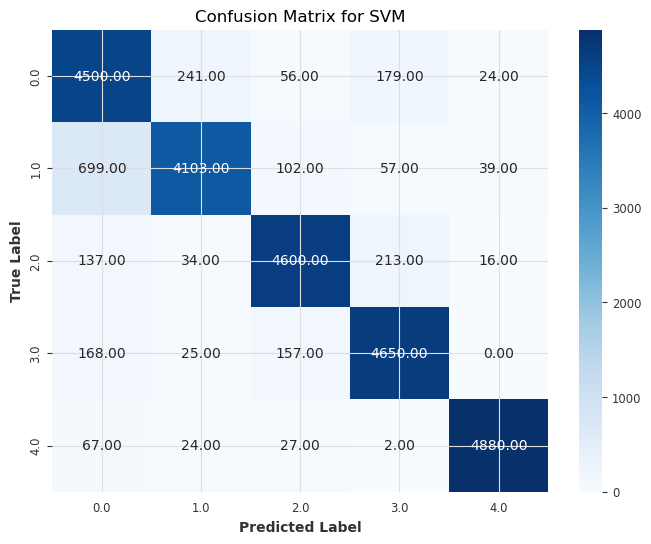

In [82]:
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt=".2f", cmap="Blues", xticklabels=labels, yticklabels=labels)
plt.title(f'Confusion Matrix for SVM')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

همین کانفیوژن ماتریکس را نرمالایز می کنیم

In [84]:
conf_matrix.sum(axis=1)

array([5000, 5000, 5000, 5000, 5000], dtype=int64)

In [85]:
conf_matrix.sum(axis=1)[:, np.newaxis]

array([[5000],
       [5000],
       [5000],
       [5000],
       [5000]], dtype=int64)

In [86]:
conf_matrix_percentage = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

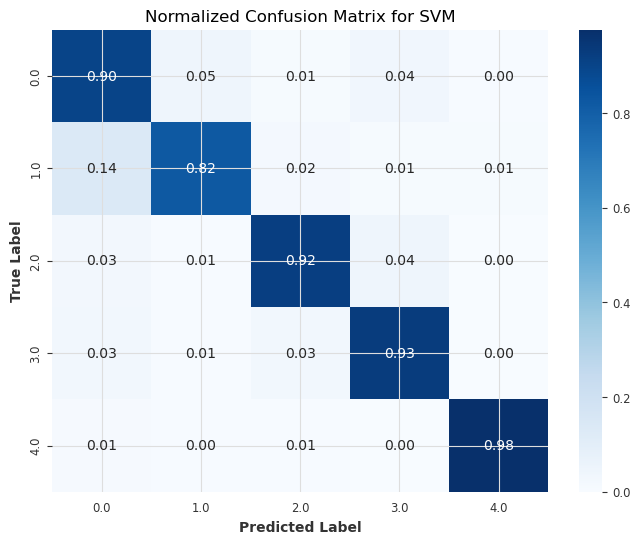

In [87]:
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_percentage, annot=True, fmt=".2f", cmap="Blues", xticklabels=labels, yticklabels=labels)
plt.title(f'Normalized Confusion Matrix for SVM')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

## Random Forest (RF) Model

In [89]:
rf_classifier = RandomForestClassifier(n_estimators=50, random_state=123)

rf_classifier.fit(X_train_normalized, y_train)

y_pred_valid = rf_classifier.predict(X_valid_normalized)
accuracy_valid = accuracy_score(y_valid, y_pred_valid)
print("Validation Accuracy:", accuracy_valid)


y_pred_test = rf_classifier.predict(X_test_normalized)


accuracy_test = accuracy_score(y_test, y_pred_test)
print("Test Accuracy:", accuracy_test)

Validation Accuracy: 0.9958
Test Accuracy: 0.87416


In [90]:
conf_matrix = confusion_matrix(y_test, y_pred_test)

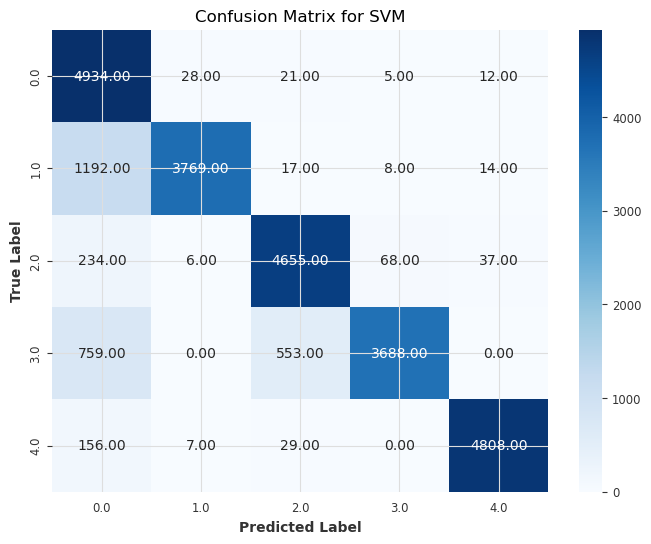

In [91]:
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt=".2f", cmap="Blues", xticklabels=labels, yticklabels=labels)
plt.title(f'Confusion Matrix for SVM')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [92]:
conf_matrix_percentage = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]


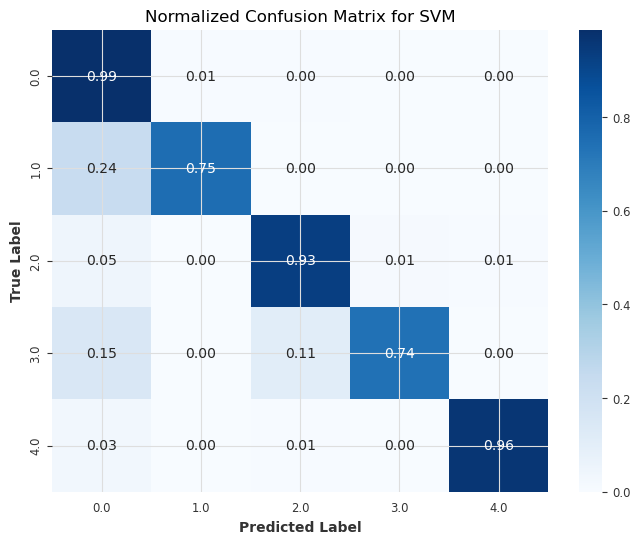

In [93]:
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_percentage, annot=True, fmt=".2f", cmap="Blues", xticklabels=labels, yticklabels=labels)
plt.title(f'Normalized Confusion Matrix for SVM')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

## Decision Tree (DT) Model

In [95]:
dt_classifier = DecisionTreeClassifier(random_state=42)

In [96]:
dt_classifier.fit(X_train_normalized, y_train)

y_pred_valid = dt_classifier.predict(X_valid_normalized)
accuracy_valid = accuracy_score(y_valid, y_pred_valid)
print("Validation Accuracy:", accuracy_valid)


y_pred_test = dt_classifier.predict(X_test_normalized)


accuracy_test = accuracy_score(y_test, y_pred_test)
print("Test Accuracy:", accuracy_test)

Validation Accuracy: 0.983
Test Accuracy: 0.82836


In [97]:
conf_matrix = confusion_matrix(y_test, y_pred_test)

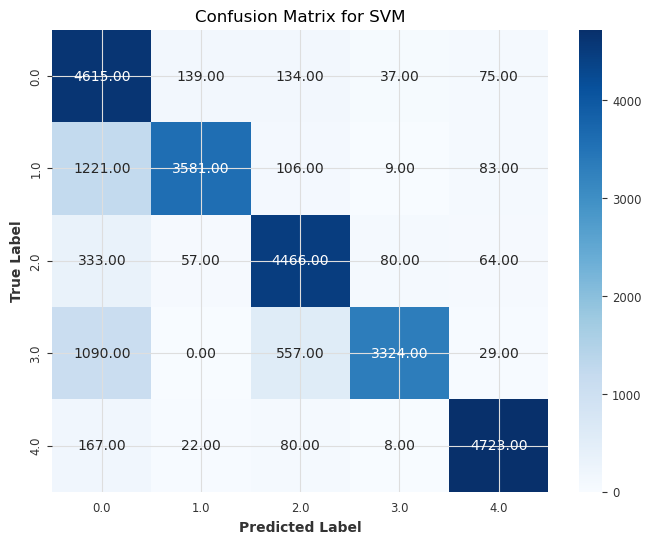

In [98]:
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt=".2f", cmap="Blues", xticklabels=labels, yticklabels=labels)
plt.title(f'Confusion Matrix for SVM')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [99]:
conf_matrix_percentage = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]


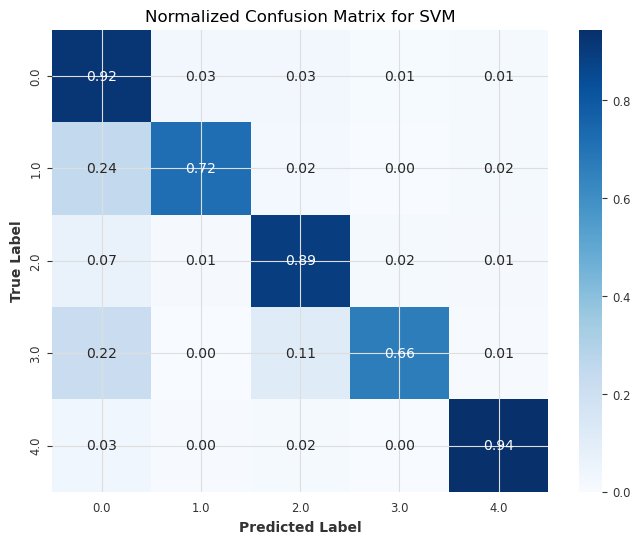

In [100]:
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_percentage, annot=True, fmt=".2f", cmap="Blues", xticklabels=labels, yticklabels=labels)
plt.title(f'Normalized Confusion Matrix for SVM')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

## Ensemble Model (Voting)

In [102]:
voting_clf = VotingClassifier(estimators=[('decision_tree', dt_classifier), ('rf', rf_classifier), ('support_vector_machine', svm_classifier)], voting='hard')


voting_clf.fit(X_train_normalized, y_train)


y_pred_valid = voting_clf.predict(X_valid_normalized)


accuracy_valid = accuracy_score(y_valid, y_pred_valid)
print("Validation Accuracy:", accuracy_valid)


y_pred_test = voting_clf.predict(X_test_normalized)


accuracy_test = accuracy_score(y_test, y_pred_test)
print("Test Accuracy:", accuracy_test)

Validation Accuracy: 0.99525
Test Accuracy: 0.88156


In [103]:
conf_matrix = confusion_matrix(y_test, y_pred_test)


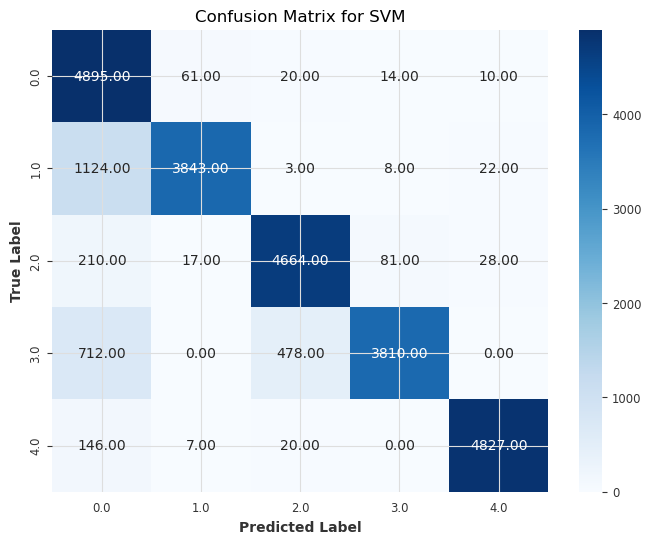

In [104]:
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt=".2f", cmap="Blues", xticklabels=labels, yticklabels=labels)
plt.title(f'Confusion Matrix for SVM')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [105]:
conf_matrix_percentage = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]


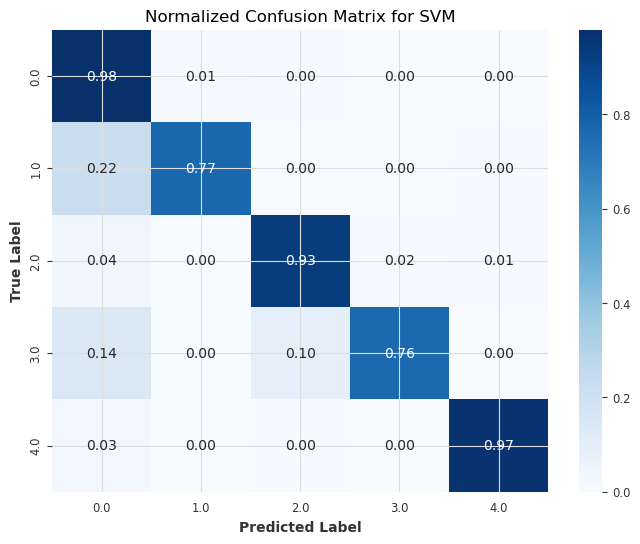

In [106]:
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_percentage, annot=True, fmt=".2f", cmap="Blues", xticklabels=labels, yticklabels=labels)
plt.title(f'Normalized Confusion Matrix for SVM')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

## Deep Learning Models

In [108]:
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

#### ANN model (FNN)

In [110]:
X_train_normalized.shape[1]

187

In [111]:
ann_model = Sequential([
    Input(shape=(X_train_normalized.shape[1],)),
    Dense(512, activation="relu"),
    Dropout(0.2),
    Dense(512, activation="relu"),
    Dropout(0.2),
    Dense(5, activation="softmax")
])

In [112]:
ann_model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])

In [113]:
ann_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               96256     
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 512)               262656    
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_2 (Dense)             (None, 5)                 2565      
                                                                 
Total params: 361,477
Trainable params: 361,477
Non-trainable params: 0
_________________________________________________________________


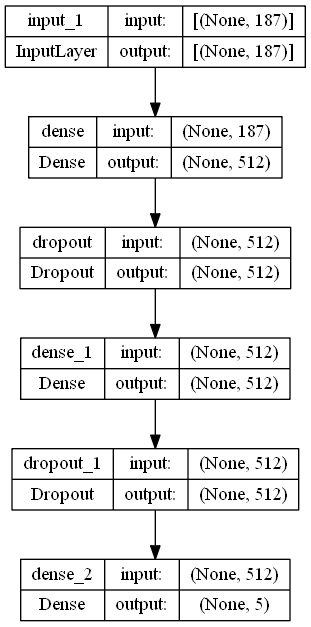

In [114]:
plot_model(ann_model, to_file='Ann_model_plot.png', show_shapes=True, show_layer_names=True, rankdir='TB', expand_nested=True, dpi=96)

In [115]:
history_ann = ann_model.fit(
    X_train_normalized, y_train,
    validation_data=(X_valid_normalized, y_valid),
    epochs=50,
    batch_size=128,
    callbacks=[early_stopping],
    verbose=1
)

Epoch 1/50
625/625 [==============================] - 2s 2ms/step - loss: 0.3684 - accuracy: 0.8654 - val_loss: 0.2250 - val_accuracy: 0.9181
Epoch 2/50
625/625 [==============================] - 1s 2ms/step - loss: 0.2066 - accuracy: 0.9252 - val_loss: 0.1585 - val_accuracy: 0.9417
Epoch 3/50
625/625 [==============================] - 1s 2ms/step - loss: 0.1545 - accuracy: 0.9457 - val_loss: 0.1144 - val_accuracy: 0.9588
Epoch 4/50
625/625 [==============================] - 1s 2ms/step - loss: 0.1268 - accuracy: 0.9550 - val_loss: 0.1010 - val_accuracy: 0.9663
Epoch 5/50
625/625 [==============================] - 1s 2ms/step - loss: 0.1119 - accuracy: 0.9611 - val_loss: 0.0869 - val_accuracy: 0.9704
Epoch 6/50
625/625 [==============================] - 1s 2ms/step - loss: 0.0945 - accuracy: 0.9677 - val_loss: 0.0825 - val_accuracy: 0.9719
Epoch 7/50
625/625 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.9690 - val_loss: 0.0811 - val_accuracy: 0.9739
Epoch 

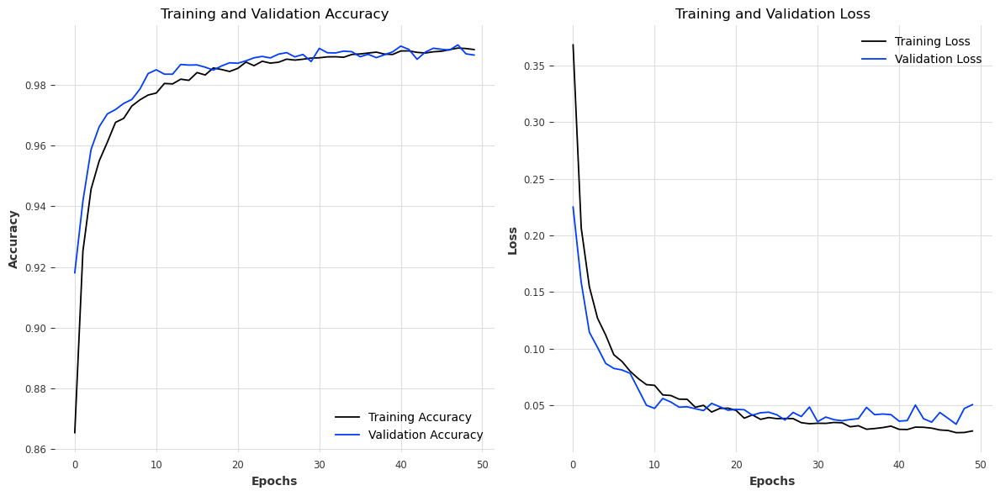

In [116]:
# Plot training history
plt.figure(figsize=(12, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history_ann.history['accuracy'], label='Training Accuracy')
plt.plot(history_ann.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history_ann.history['loss'], label='Training Loss')
plt.plot(history_ann.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()

مدل شبکه عصبی (ann_model) روی داده تست نرمال‌شده (X_test_normalized) پیش‌بینی می‌کند.

خروجی predict برای مسائل دسته‌بندی چندکلاسه، یک آرایه‌ی ۲بعدی است:

هر سطر: مربوط به یک نمونه

هر ستون: احتمال تعلق آن نمونه به هر کلاس (مثلاً [0.1, 0.7, 0.2] یعنی ۱۰٪ کلاس ۰، ۷۰٪ کلاس ۱، ۲۰٪ کلاس ۲)

اسم متغیر:
y_pred_test_prob یعنی “احتمال پیش‌بینی‌شده برای هر کلاس در داده تست”

In [118]:
y_pred_test_prob = ann_model.predict(X_test_normalized)

782/782 [==============================] - 1s 845us/step


برای هر نمونه (سطر)، شماره ستونی را برمی‌گرداند که بیشترین مقدار (بیشترین احتمال) را دارد.

یعنی کلاس نهایی پیش‌بینی‌شده (مثلاً از [0.1, 0.7, 0.2] خروجی می‌شود کلاس ۱).

اسم متغیر:
y_pred_test یعنی "کلاس برنده‌ی پیش‌بینی‌شده برای هر نمونه تست"

In [120]:
y_pred_test = np.argmax(y_pred_test_prob, axis=1)

این هم دقیقاً مثل خط اول است اما برای داده اعتبارسنجی (validation).

خروجی: احتمالات پیش‌بینی‌شده‌ی هر کلاس برای داده validation.

In [122]:
y_pred_valid_prob = ann_model.predict(X_valid_normalized)

625/625 [==============================] - 1s 885us/step


In [123]:
accuracy_valid = accuracy_score(y_valid, y_pred_valid)
print("Validation Accuracy:", accuracy_valid)



accuracy_test = accuracy_score(y_test, y_pred_test)
print("Test Accuracy:", accuracy_test)

Validation Accuracy: 0.99525
Test Accuracy: 0.91784


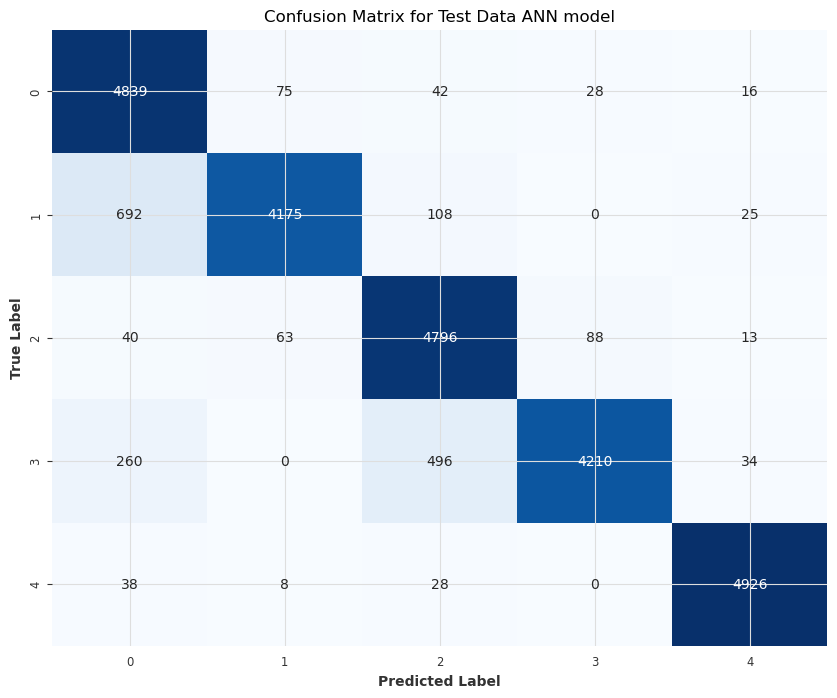

In [124]:
conf_matrix = confusion_matrix(y_test, y_pred_test)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for Test Data ANN model")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

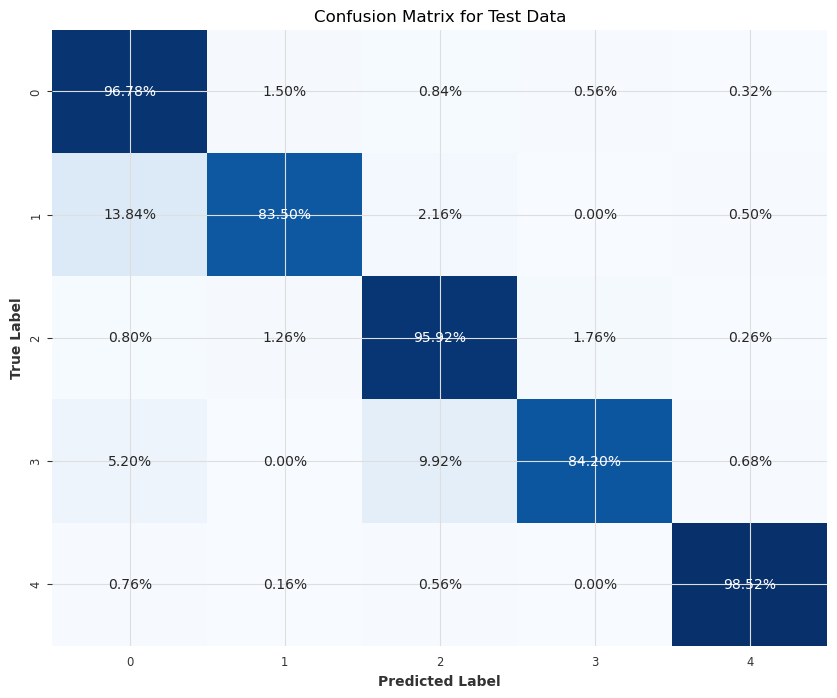

In [125]:
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

# Plot confusion matrix with percentages
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_percent, annot=True, fmt=".2%", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for Test Data")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

In [126]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

         0.0       0.82      0.97      0.89      5000
         1.0       0.97      0.83      0.90      5000
         2.0       0.88      0.96      0.92      5000
         3.0       0.97      0.84      0.90      5000
         4.0       0.98      0.99      0.98      5000

    accuracy                           0.92     25000
   macro avg       0.92      0.92      0.92     25000
weighted avg       0.92      0.92      0.92     25000



In [127]:
def evaluate_model(y_test_classes, y_pred_test_classes):
    accuracy = accuracy_score(y_test_classes, y_pred_test_classes)
    precision = precision_score(y_test_classes, y_pred_test_classes, average='micro')
    recall = recall_score(y_test_classes, y_pred_test_classes, average='micro')
    f1 = f1_score(y_test_classes, y_pred_test_classes, average='micro')

    print(f"Accuracy: {accuracy:.3f}")
    print(f"Precision: {precision:.3f}")
    print(f"Recall: {recall:.3}")
    print(f"F1-score: {f1:.3f}")

In [128]:
# Example usage:
evaluate_model(y_test, y_pred_test)

Accuracy: 0.918
Precision: 0.918
Recall: 0.918
F1-score: 0.918


In [129]:
ann_model.save("ANN_model.h5")

## Convolutional Neural Network (CNN) Model¶

In [131]:
cnn_model = Sequential([
    Input(shape=(X_train_normalized.shape[1], 1)),
    Conv1D(32, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),

    Conv1D(64, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.2),
    Dense(5, activation='softmax')
])

In [132]:
cnn_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [133]:
cnn_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 185, 32)           128       
                                                                 
 batch_normalization (BatchN  (None, 185, 32)          128       
 ormalization)                                                   
                                                                 
 max_pooling1d (MaxPooling1D  (None, 92, 32)           0         
 )                                                               
                                                                 
 dropout_2 (Dropout)         (None, 92, 32)            0         
                                                                 
 conv1d_1 (Conv1D)           (None, 90, 64)            6208      
                                                                 
 batch_normalization_1 (Batc  (None, 90, 64)          

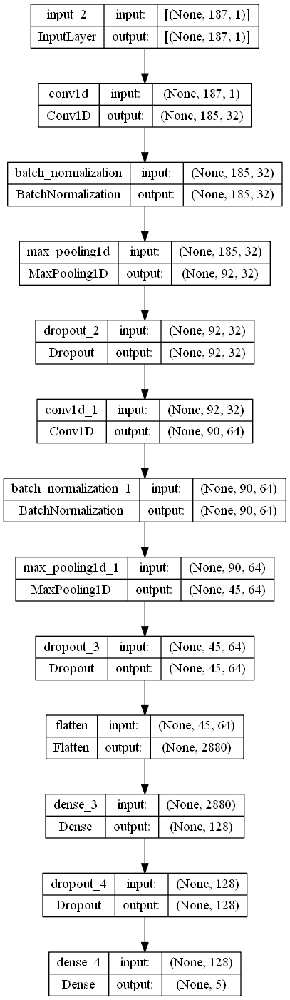

In [134]:
plot_model(cnn_model, to_file='CNN_model_plot.png', show_shapes=True, show_layer_names=True, rankdir='TB', expand_nested=True, dpi=96)

In [135]:
history_cnn = cnn_model.fit(
    X_train_normalized.reshape(-1, X_train_normalized.shape[1], 1),
    y_train,
    validation_data=(X_valid_normalized.reshape(-1, X_valid_normalized.shape[1], 1), y_valid),
    epochs=50,
    batch_size=64,
    callbacks=[early_stopping],
    verbose=1
)

Epoch 1/50
1250/1250 [==============================] - 12s 4ms/step - loss: 0.3447 - accuracy: 0.8793 - val_loss: 0.1647 - val_accuracy: 0.9411
Epoch 2/50
1250/1250 [==============================] - 4s 4ms/step - loss: 0.1603 - accuracy: 0.9425 - val_loss: 0.0942 - val_accuracy: 0.9678
Epoch 3/50
1250/1250 [==============================] - 5s 4ms/step - loss: 0.1160 - accuracy: 0.9598 - val_loss: 0.0740 - val_accuracy: 0.9757
Epoch 4/50
1250/1250 [==============================] - 4s 3ms/step - loss: 0.0924 - accuracy: 0.9675 - val_loss: 0.0604 - val_accuracy: 0.9804
Epoch 5/50
1250/1250 [==============================] - 4s 3ms/step - loss: 0.0785 - accuracy: 0.9723 - val_loss: 0.0531 - val_accuracy: 0.9826
Epoch 6/50
1250/1250 [==============================] - 4s 3ms/step - loss: 0.0721 - accuracy: 0.9748 - val_loss: 0.0469 - val_accuracy: 0.9855
Epoch 7/50
1250/1250 [==============================] - 4s 4ms/step - loss: 0.0623 - accuracy: 0.9794 - val_loss: 0.0440 - val_accuracy

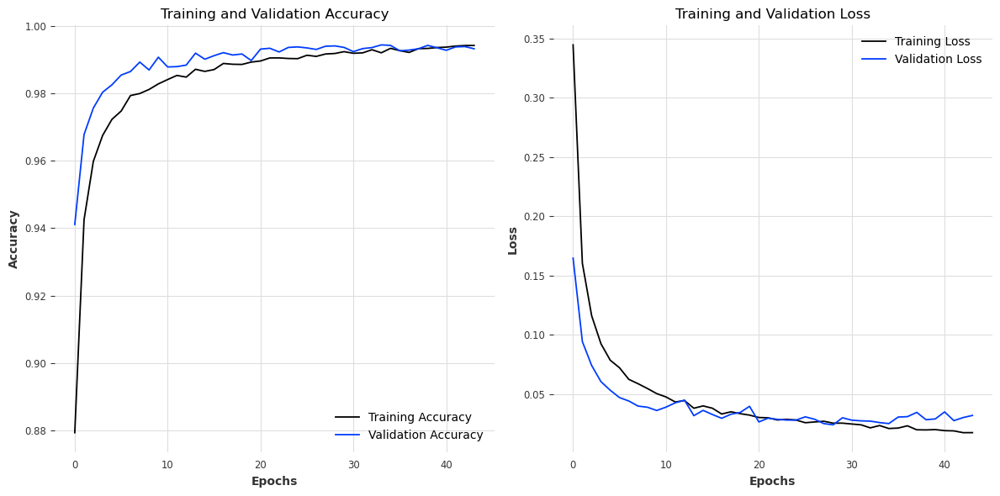

In [136]:
# Plot training history
plt.figure(figsize=(12, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history_cnn.history['accuracy'], label='Training Accuracy')
plt.plot(history_cnn.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history_cnn.history['loss'], label='Training Loss')
plt.plot(history_cnn.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [137]:
y_pred_test_prob = cnn_model.predict(X_test_normalized.reshape(-1, X_test_normalized.shape[1], 1))

782/782 [==============================] - 1s 1ms/step


In [138]:
y_pred_test = np.argmax(y_pred_test_prob, axis=1)

In [139]:
y_pred_valid_prob = cnn_model.predict(X_valid_normalized.reshape(-1, X_valid_normalized.shape[1], 1))
y_pred_valid = np.argmax(y_pred_valid_prob, axis=1)

625/625 [==============================] - 1s 1ms/step


In [140]:
accuracy_valid = accuracy_score(y_valid, y_pred_valid)
print("Validation Accuracy:", accuracy_valid)



accuracy_test = accuracy_score(y_test, y_pred_test)
print("Test Accuracy:", accuracy_test)

Validation Accuracy: 0.9941
Test Accuracy: 0.9304


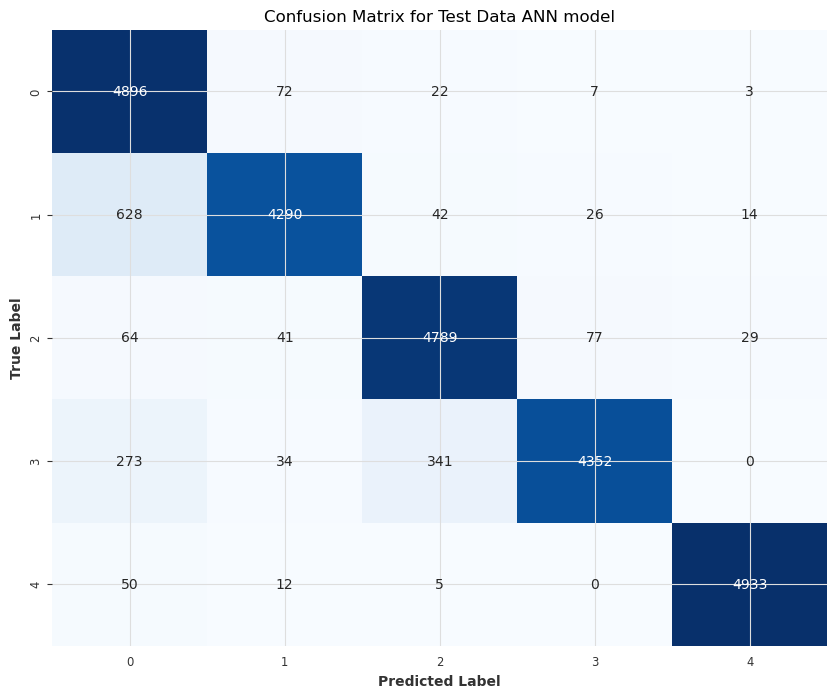

In [141]:
conf_matrix = confusion_matrix(y_test, y_pred_test)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for Test Data ANN model")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

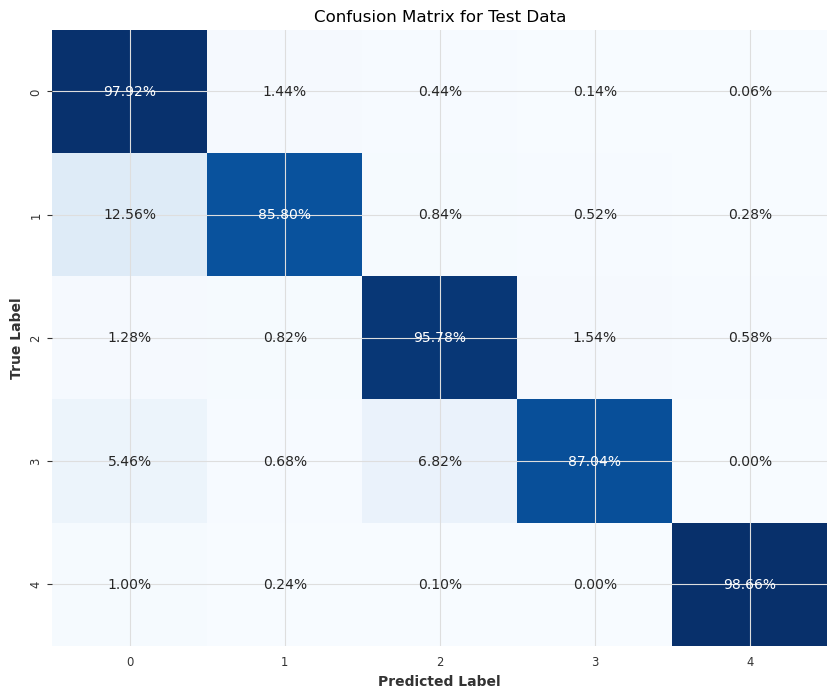

In [142]:
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

# Plot confusion matrix with percentages
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_percent, annot=True, fmt=".2%", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for Test Data")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

In [143]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

         0.0       0.83      0.98      0.90      5000
         1.0       0.96      0.86      0.91      5000
         2.0       0.92      0.96      0.94      5000
         3.0       0.98      0.87      0.92      5000
         4.0       0.99      0.99      0.99      5000

    accuracy                           0.93     25000
   macro avg       0.94      0.93      0.93     25000
weighted avg       0.94      0.93      0.93     25000



In [144]:
evaluate_model(y_test, y_pred_test)

Accuracy: 0.930
Precision: 0.930
Recall: 0.93
F1-score: 0.930


In [145]:
cnn_model.save("CNN_model.h5")

### Long Short-Term Memory (LSTM) Model¶

In [147]:
lstm_model = Sequential([
    Input(shape=(X_train_normalized.shape[1], 1)),
    LSTM(64, return_sequences=True),
    Dropout(0.2),
    LSTM(64),
    Dropout(0.2),
    Dense(128, activation='relu'),
    Dropout(0.2),
    Dense(5, activation='softmax')
])

In [148]:
lstm_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [149]:
lstm_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 187, 64)           16896     
                                                                 
 dropout_5 (Dropout)         (None, 187, 64)           0         
                                                                 
 lstm_1 (LSTM)               (None, 64)                33024     
                                                                 
 dropout_6 (Dropout)         (None, 64)                0         
                                                                 
 dense_5 (Dense)             (None, 128)               8320      
                                                                 
 dropout_7 (Dropout)         (None, 128)               0         
                                                                 
 dense_6 (Dense)             (None, 5)                

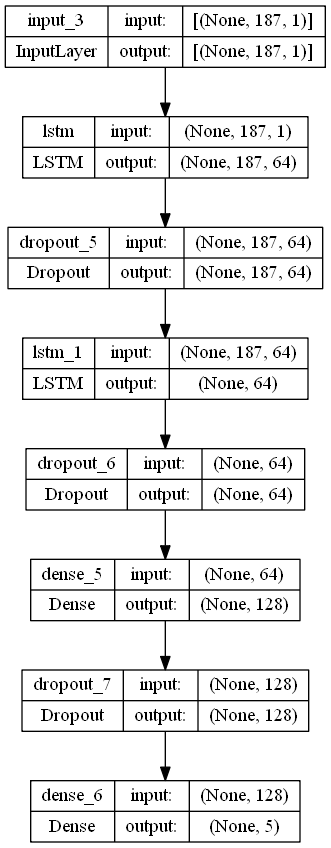

In [150]:
plot_model(lstm_model, to_file='RNN_model_plot.png', show_shapes=True, show_layer_names=True, rankdir='TB', expand_nested=True, dpi=96)

In [151]:
history_rnn = lstm_model.fit(
    X_train_normalized.reshape(-1, X_train_normalized.shape[1],1),
    y_train,
    validation_data=(X_valid_normalized.reshape(-1, X_valid_normalized.shape[1],1), y_valid),
    epochs=50,
    batch_size=128,
    callbacks=[early_stopping],
    verbose=1
)

Epoch 1/50
625/625 [==============================] - 20s 29ms/step - loss: 1.1798 - accuracy: 0.5145 - val_loss: 1.0138 - val_accuracy: 0.6096
Epoch 2/50
625/625 [==============================] - 21s 33ms/step - loss: 1.0176 - accuracy: 0.6106 - val_loss: 1.0700 - val_accuracy: 0.5710
Epoch 3/50
625/625 [==============================] - 21s 34ms/step - loss: 1.0174 - accuracy: 0.6112 - val_loss: 0.8866 - val_accuracy: 0.6676
Epoch 4/50
625/625 [==============================] - 17s 28ms/step - loss: 0.9634 - accuracy: 0.6398 - val_loss: 0.9352 - val_accuracy: 0.6694
Epoch 5/50
625/625 [==============================] - 18s 29ms/step - loss: 0.8774 - accuracy: 0.6751 - val_loss: 0.6854 - val_accuracy: 0.7550
Epoch 6/50
625/625 [==============================] - 18s 28ms/step - loss: 0.6715 - accuracy: 0.7634 - val_loss: 0.5983 - val_accuracy: 0.7963
Epoch 7/50
625/625 [==============================] - 17s 28ms/step - loss: 0.5986 - accuracy: 0.7983 - val_loss: 0.4993 - val_accuracy:

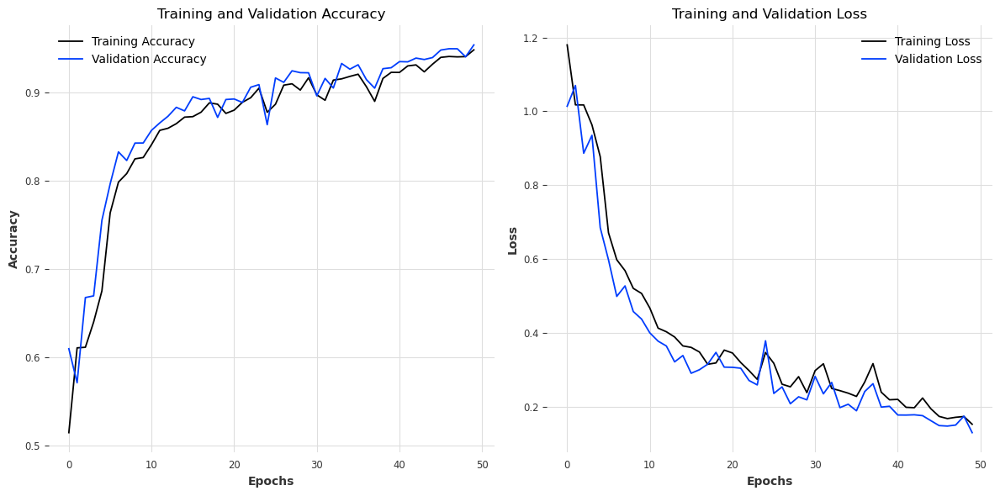

In [152]:
# Plot training history
plt.figure(figsize=(12, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history_rnn.history['accuracy'], label='Training Accuracy')
plt.plot(history_rnn.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history_rnn.history['loss'], label='Training Loss')
plt.plot(history_rnn.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [153]:
y_pred_test_prob = lstm_model.predict(X_test_normalized.reshape(-1, X_test_normalized.shape[1], 1))

782/782 [==============================] - 7s 9ms/step


In [154]:
y_pred_test = np.argmax(y_pred_test_prob, axis=1)

In [155]:
y_pred_valid_prob = lstm_model.predict(X_valid_normalized.reshape(-1, X_valid_normalized.shape[1], 1))
y_pred_valid = np.argmax(y_pred_valid_prob, axis=1)

625/625 [==============================] - 5s 8ms/step


In [156]:
accuracy_valid = accuracy_score(y_valid, y_pred_valid)
print("Validation Accuracy:", accuracy_valid)



accuracy_test = accuracy_score(y_test, y_pred_test)
print("Test Accuracy:", accuracy_test)

Validation Accuracy: 0.95365
Test Accuracy: 0.90972


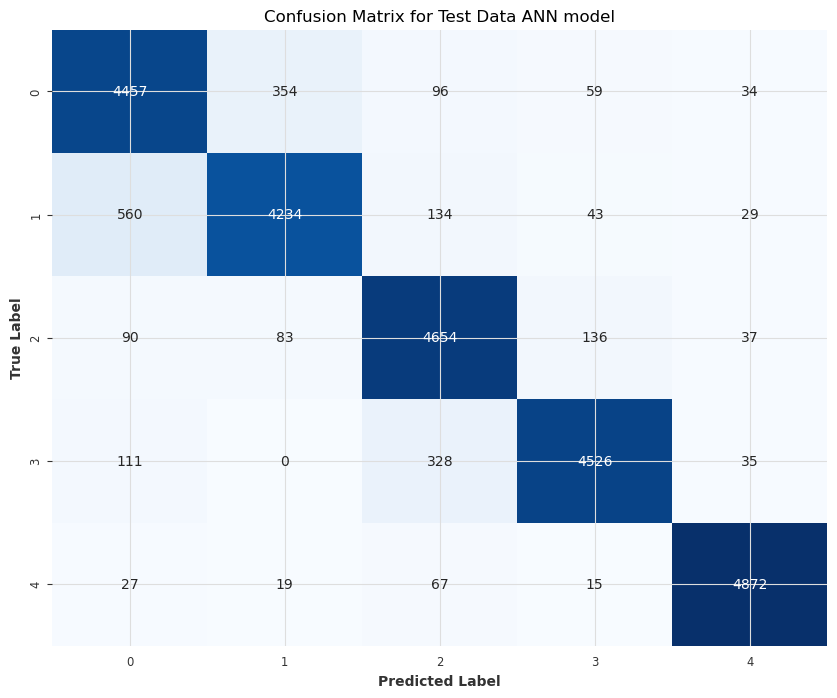

In [157]:
conf_matrix = confusion_matrix(y_test, y_pred_test)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for Test Data ANN model")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

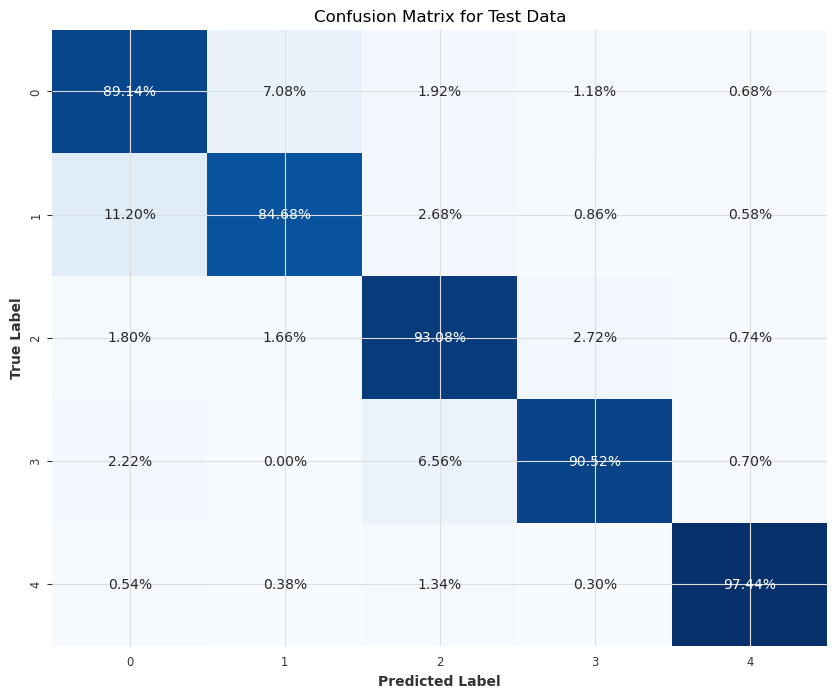

In [158]:
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

# Plot confusion matrix with percentages
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_percent, annot=True, fmt=".2%", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for Test Data")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

In [159]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

         0.0       0.85      0.89      0.87      5000
         1.0       0.90      0.85      0.87      5000
         2.0       0.88      0.93      0.91      5000
         3.0       0.95      0.91      0.93      5000
         4.0       0.97      0.97      0.97      5000

    accuracy                           0.91     25000
   macro avg       0.91      0.91      0.91     25000
weighted avg       0.91      0.91      0.91     25000



In [160]:
evaluate_model(y_test, y_pred_test)

Accuracy: 0.910
Precision: 0.910
Recall: 0.91
F1-score: 0.910


In [161]:
lstm_model.save("RNN_model.h5")

# Transformer

In [146]:
# اگر داده شما مثل ANN است و فقط Dense استفاده می‌کند، نیازی به reshape نیست!
# اما برای Transformer باید شکل داده (نمونه‌ها، طول سری، فیچر) باشد.
# فرض: X_train_normalized, X_valid_normalized, X_test_normalized به شکل (نمونه, طول_سری) هستند
# باید آن را به (نمونه, طول_سری, 1) تبدیل کنیم:
X_train_t = X_train_normalized[..., np.newaxis]
X_valid_t = X_valid_normalized[..., np.newaxis]
X_test_t = X_test_normalized[..., np.newaxis]


In [150]:
input_shape = X_train_t.shape[1:]
num_classes = len(np.unique(y_train))

def transformer_encoder(inputs, head_size=32, num_heads=2, ff_dim=64, dropout=0.1):
    x = layers.MultiHeadAttention(key_dim=head_size, num_heads=num_heads, dropout=dropout)(inputs, inputs)
    x = layers.Dropout(dropout)(x)
    x = layers.LayerNormalization(epsilon=1e-6)(x)
    x = x + inputs

    x2 = layers.Conv1D(filters=ff_dim, kernel_size=1, activation="relu")(x)
    x2 = layers.Dropout(dropout)(x2)
    x2 = layers.Conv1D(filters=inputs.shape[-1], kernel_size=1)(x2)
    x2 = layers.LayerNormalization(epsilon=1e-6)(x2)
    return x + x2

def build_hybrid_transformer(input_shape, num_classes):
    inputs = keras.Input(shape=input_shape)
    x = layers.Conv1D(32, 7, padding='same', activation='relu')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Conv1D(32, 5, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = transformer_encoder(x, head_size=32, num_heads=2, ff_dim=64, dropout=0.3)
    x = transformer_encoder(x, head_size=32, num_heads=2, ff_dim=64, dropout=0.3)
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)
    model = keras.Model(inputs, outputs)
    return model

hybrid_transformer_model = build_hybrid_transformer(input_shape, num_classes)
hybrid_transformer_model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])
hybrid_transformer_model.summary()



Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 187, 1)]     0           []                               
                                                                                                  
 conv1d (Conv1D)                (None, 187, 32)      256         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 187, 32)     128         ['conv1d[0][0]']                 
 alization)                                                                                       
                                                                                                  
 conv1d_1 (Conv1D)              (None, 187, 32)      5152        ['batch_normalization[0][0]']

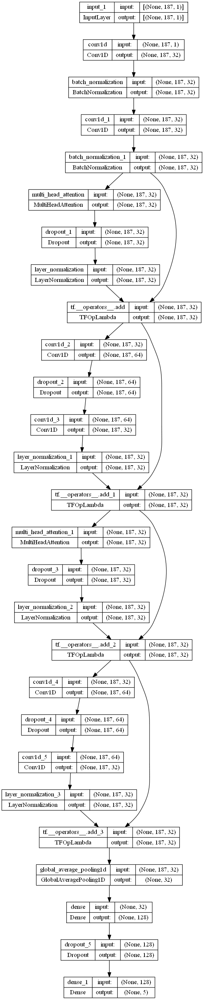

In [177]:
plot_model(hybrid_transformer_model, to_file='hybrid_transformer_model_plot.png', show_shapes=True, show_layer_names=True, rankdir='TB', expand_nested=True, dpi=96)

In [152]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history_transformer = hybrid_transformer_model.fit(
    X_train_t, y_train,
    validation_data=(X_valid_t, y_valid),
    epochs=50,
    batch_size=128,
    callbacks=[early_stopping],
    verbose=1
)


Epoch 1/50
625/625 [==============================] - 14s 20ms/step - loss: 0.5784 - accuracy: 0.7899 - val_loss: 0.7034 - val_accuracy: 0.7995
Epoch 2/50
625/625 [==============================] - 12s 19ms/step - loss: 0.3358 - accuracy: 0.8806 - val_loss: 0.3275 - val_accuracy: 0.8946
Epoch 3/50
625/625 [==============================] - 12s 19ms/step - loss: 0.2819 - accuracy: 0.8985 - val_loss: 0.3066 - val_accuracy: 0.9060
Epoch 4/50
625/625 [==============================] - 12s 19ms/step - loss: 0.2421 - accuracy: 0.9133 - val_loss: 0.2729 - val_accuracy: 0.9194
Epoch 5/50
625/625 [==============================] - 12s 19ms/step - loss: 0.2169 - accuracy: 0.9227 - val_loss: 0.2079 - val_accuracy: 0.9323
Epoch 6/50
625/625 [==============================] - 12s 20ms/step - loss: 0.1964 - accuracy: 0.9303 - val_loss: 0.2346 - val_accuracy: 0.9342
Epoch 7/50
625/625 [==============================] - 12s 19ms/step - loss: 0.1766 - accuracy: 0.9370 - val_loss: 0.2051 - val_accuracy:

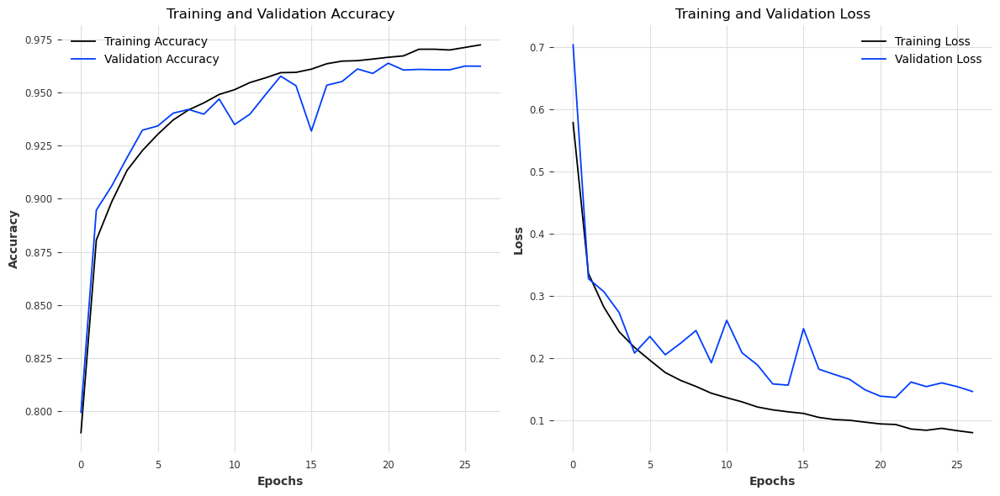

In [154]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history_transformer.history['accuracy'], label='Training Accuracy')
plt.plot(history_transformer.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history_transformer.history['loss'], label='Training Loss')
plt.plot(history_transformer.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()


توزیع داده رو چک کنیم

In [157]:
import numpy as np
print("Train:", np.bincount(y_train.astype(int)))
print("Valid:", np.bincount(y_valid.astype(int)))
print("Test:", np.bincount(y_test.astype(int)))


Train: [15982 15985 15998 16013 16022]
Valid: [4018 4015 4002 3987 3978]
Test: [5000 5000 5000 5000 5000]


782/782 [==============================] - 3s 3ms/step
Accuracy: 0.913
Precision: 0.913
Recall: 0.913
F1-score: 0.913
              precision    recall  f1-score   support

         0.0       0.84      0.91      0.87      5000
         1.0       0.87      0.86      0.87      5000
         2.0       0.94      0.91      0.92      5000
         3.0       0.94      0.91      0.92      5000
         4.0       0.99      0.98      0.98      5000

    accuracy                           0.91     25000
   macro avg       0.91      0.91      0.91     25000
weighted avg       0.91      0.91      0.91     25000



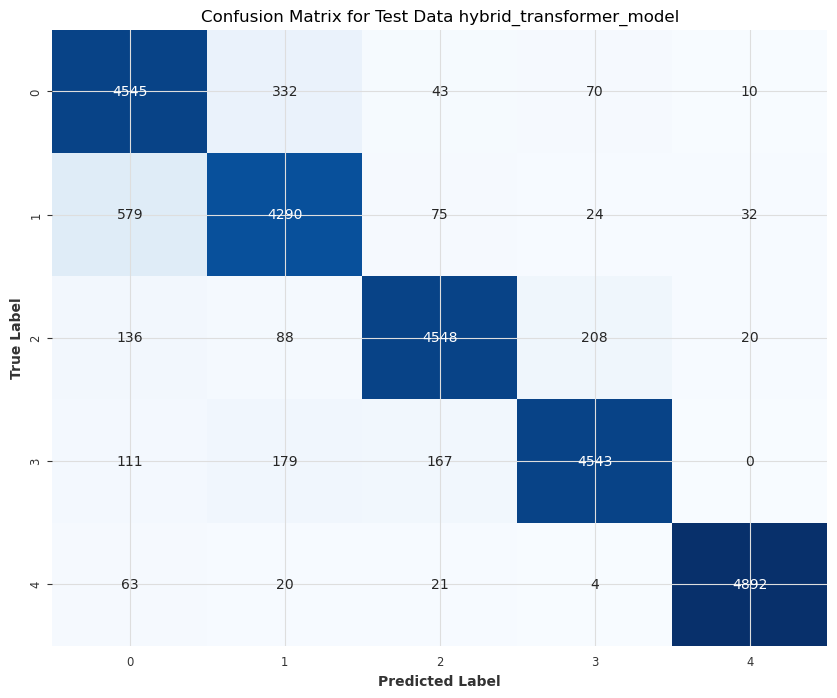

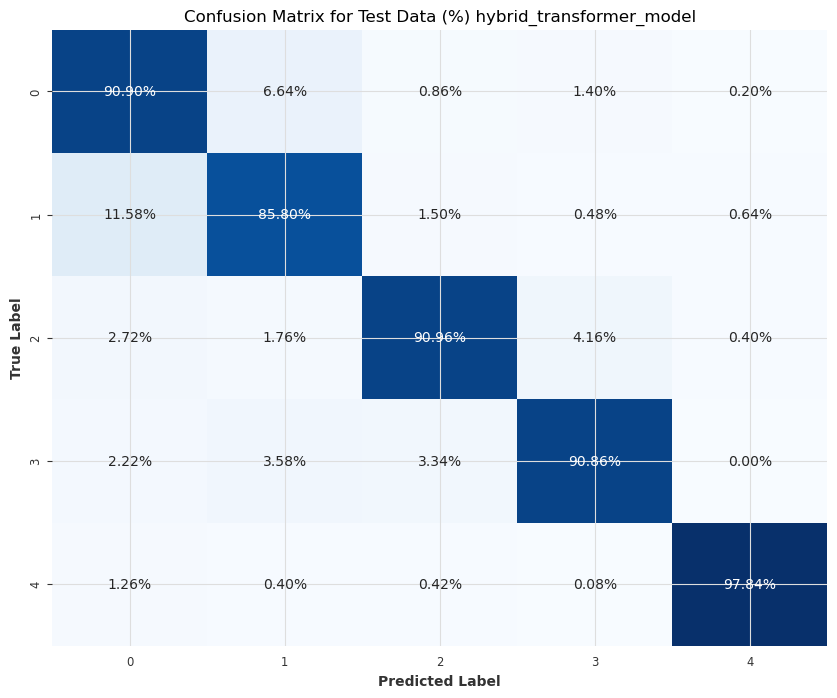

In [159]:
# پیش‌بینی
y_pred_test_prob = hybrid_transformer_model.predict(X_test_t)
y_pred_test = np.argmax(y_pred_test_prob, axis=1)

# دقت و سایر معیارها
def evaluate_model(y_test_classes, y_pred_test_classes):
    accuracy = accuracy_score(y_test_classes, y_pred_test_classes)
    precision = precision_score(y_test_classes, y_pred_test_classes, average='micro')
    recall = recall_score(y_test_classes, y_pred_test_classes, average='micro')
    f1 = f1_score(y_test_classes, y_pred_test_classes, average='micro')

    print(f"Accuracy: {accuracy:.3f}")
    print(f"Precision: {precision:.3f}")
    print(f"Recall: {recall:.3f}")
    print(f"F1-score: {f1:.3f}")

evaluate_model(y_test, y_pred_test)

print(classification_report(y_test, y_pred_test))

conf_matrix = confusion_matrix(y_test, y_pred_test)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for Test Data hybrid_transformer_model")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_percent, annot=True, fmt=".2%", cmap="Blues", cbar=False)
plt.title("Confusion Matrix for Test Data (%) hybrid_transformer_model")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


In [163]:
hybrid_transformer_model.save("Transformer_model.h5")

# Model loading

In [166]:
ann_model = tf.keras.models.load_model("ANN_model.h5")

In [168]:
cnn_model = tf.keras.models.load_model("CNN_model.h5")

In [170]:
rnn_model = tf.keras.models.load_model("RNN_model.h5")

In [181]:
hybrid_transformer_model = tf.keras.models.load_model("Transformer_model.h5")

### Ensemble (Model Averaging)

782/782 [==============================] - 2s 2ms/step
Model Comparison Metrics:
                    Accuracy  Precision   Recall       F1
ANN                  0.91784    0.91784  0.91784  0.91784
CNN                  0.93040    0.93040  0.93040  0.93040
RNN                  0.90972    0.90972  0.90972  0.90972
Hybrid Transformer   0.91272    0.91272  0.91272  0.91272


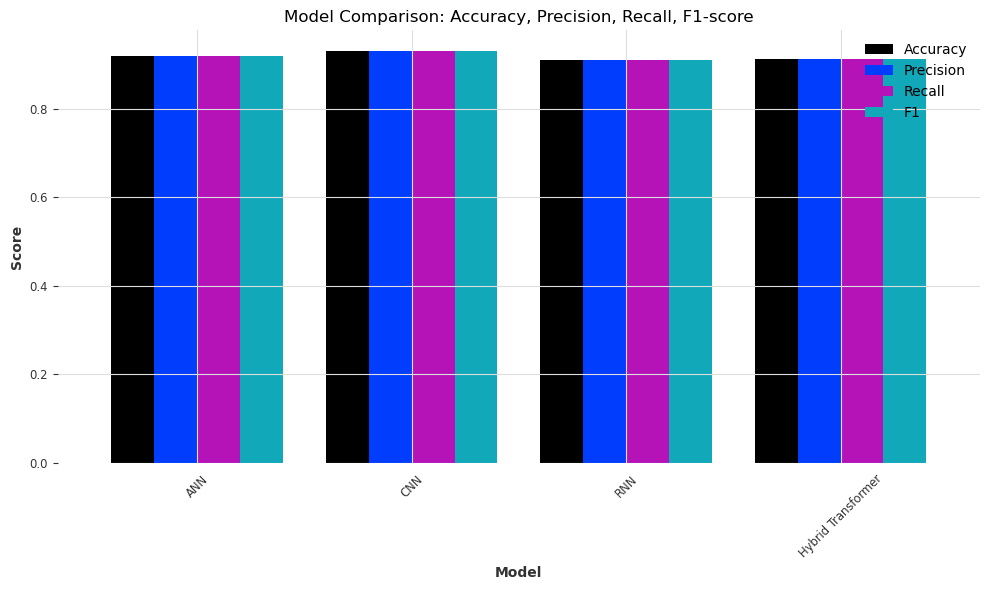

782/782 [==============================] - 2s 2ms/step

Ensemble Accuracy (Weighted Averaging): 0.93548
Ensemble Accuracy (Voting): 0.92392


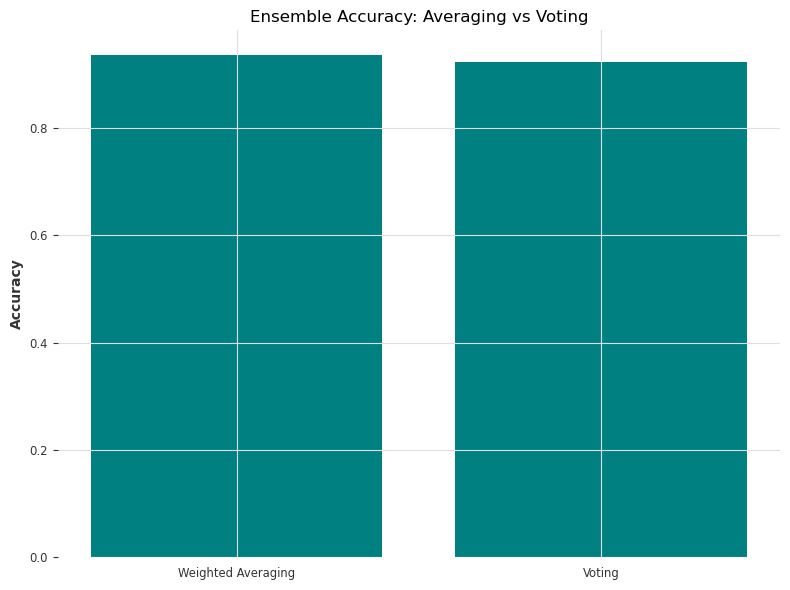

In [183]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# تعریف تابع محاسبه متریک‌ها
def get_metrics(y_true, y_pred):
    """
    محاسبه متریک‌های دقت، دقت میکرو، فراخوانی میکرو، و F1-Score میکرو.
    """
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='micro')
    recall = recall_score(y_true, y_pred, average='micro')
    f1 = f1_score(y_true, y_pred, average='micro')
    return accuracy, precision, recall, f1

metrics = {}

# پیش‌بینی هر مدل
def predict_model(model, X, model_name):
    """
    پیش‌بینی با استفاده از مدل‌ها و محاسبه متریک‌ها.
    """
    preds = np.argmax(model.predict(X), axis=1)
    metrics[model_name] = get_metrics(y_test, preds)

# پیش‌بینی‌ها و متریک‌های هر مدل
predict_model(ann_model, X_test_normalized, 'ANN')
predict_model(cnn_model, X_test_normalized.reshape(-1, 187, 1), 'CNN')
predict_model(rnn_model, X_test_normalized.reshape(-1, X_test_normalized.shape[1], 1), 'RNN')
predict_model(hybrid_transformer_model, X_test_t, 'Hybrid Transformer')

# نمایش متریک‌ها
df_metrics = pd.DataFrame(metrics, index=['Accuracy', 'Precision', 'Recall', 'F1'])
print("Model Comparison Metrics:")
print(df_metrics.T)

# نمودار مقایسه مدل‌ها
df_metrics.T.plot(kind='bar', figsize=(10, 6), width=0.8)
plt.title("Model Comparison: Accuracy, Precision, Recall, F1-score")
plt.ylabel('Score')
plt.xlabel('Model')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# پیش‌بینی‌ها برای Ensemble
ann_probs = ann_model.predict(X_test_normalized)
cnn_probs = cnn_model.predict(X_test_normalized.reshape(-1, 187, 1))
rnn_probs = rnn_model.predict(X_test_normalized.reshape(-1, X_test_normalized.shape[1], 1))
hybrid_probs = hybrid_transformer_model.predict(X_test_t)

# Weighted Averaging برای Ensemble
weights = {
    'ANN': 0.25,
    'CNN': 0.25,
    'RNN': 0.25,
    'Hybrid Transformer': 0.25
}

# محاسبه پیش‌بینی‌های Ensemble از میانگین وزن‌ها
ensemble_probs = (weights['ANN'] * ann_probs + 
                  weights['CNN'] * cnn_probs + 
                  weights['RNN'] * rnn_probs + 
                  weights['Hybrid Transformer'] * hybrid_probs)

ensemble_preds = np.argmax(ensemble_probs, axis=1)

# دقت Ensemble (Weighted Averaging)
ensemble_accuracy = np.mean(ensemble_preds == y_test)
print("\nEnsemble Accuracy (Weighted Averaging):", ensemble_accuracy)

# رای‌گیری برای Ensemble (Voting)
# پیش‌بینی‌ها برای رای‌گیری
ann_preds_vot = np.argmax(ann_probs, axis=1)
cnn_preds_vot = np.argmax(cnn_probs, axis=1)
rnn_preds_vot = np.argmax(rnn_probs, axis=1)
hybrid_preds_vot = np.argmax(hybrid_probs, axis=1)

ensemble_preds_vot = []
for i in range(len(X_test_normalized)):
    votes = [ann_preds_vot[i], cnn_preds_vot[i], rnn_preds_vot[i], hybrid_preds_vot[i]]
    ensemble_pred = max(set(votes), key=votes.count)
    ensemble_preds_vot.append(ensemble_pred)

ensemble_preds_vot = np.array(ensemble_preds_vot)

# دقت Ensemble (Voting)
ensemble_accuracy_vot = np.mean(ensemble_preds_vot == y_test)
print("Ensemble Accuracy (Voting):", ensemble_accuracy_vot)

# رسم نمودار دقت Ensemble
ensemble_accuracies = [ensemble_accuracy, ensemble_accuracy_vot]
methods = ['Weighted Averaging', 'Voting']

plt.figure(figsize=(8, 6))
plt.bar(methods, ensemble_accuracies, color='teal')
plt.title('Ensemble Accuracy: Averaging vs Voting')
plt.ylabel('Accuracy')
plt.tight_layout()
plt.show()


## **Explanation of Input Differences:**

1. **ANN (Dense Model):**
   * The input of this model is a **one-dimensional vector** (only features).  
   * Code: `X_train_normalized.shape` gives the number of features (number of columns).  
   * Therefore, no **reshape** is needed.  

2. **CNN (Convolutional Model):**
   * For CNN, the input must be **three-dimensional** (samples, sequence length, number of features).  
   * Therefore, `X_train_normalized` is reshaped into `(samples, sequence_length, 1)`.  
   * For CNN, you must **reshape** the data into `(samples, sequence_length, 1)`.  

3. **RNN (LSTM Model):**
   * LSTM input is also **three-dimensional**, similar to CNN.  
   * The input shape is `(samples, sequence_length, 1)`, so a **reshape** is required as well.  
   * Hence, `X_train_normalized` must be transformed into a 3D shape: `(samples, sequence_length, 1)`.  

4. **Transformer Model:**
   * Transformer inputs are also **three-dimensional**, same as CNN and LSTM.  
   * To feed the data correctly into the network, you need to add the third dimension (number of features).  
   * The input shape is `(samples, sequence_length, 1)`.  

***

### **Why Do Inputs Differ?**

* **ANN:** Dense models require **one-dimensional inputs**, so data can be fed directly without reshaping.  
* **CNN, RNN, Transformer:** These models need **three-dimensional inputs**, because they capture **local features (CNN)**, **temporal dependencies (RNN)**, and **complex dependencies (Transformer)**.  
  Therefore, the input shape must be `(samples, sequence_length, number_of_features)`.  

***

### **Solution to Handle Input Differences:**

If your dataset is one-dimensional (only features), you must transform the inputs into a three-dimensional format for CNN, RNN, and Transformer. For ANN, the inputs should remain one-dimensional.  

***

### **Proposed Approach to Fix Inputs:**

#### 1. ANN Model:
No reshaping is required for ANN, since it expects 1D input:

```python
# One-dimensional input for ANN
ann_input = X_train_normalized
```

#### 2. CNN, RNN, and Transformer Models:
For CNN, RNN, and Transformer, reshape inputs into three dimensions:

```python
# Three-dimensional input for CNN, RNN, and Transformer
X_train_t = X_train_normalized[..., np.newaxis]  # (samples, sequence_length, 1)
X_valid_t = X_valid_normalized[..., np.newaxis]
X_test_t  = X_test_normalized[..., np.newaxis]
```

#### 3. Ensure Consistency:
* For CNN and RNN: inputs are `(samples, sequence_length, 1)`.  
* For ANN: inputs are `(samples, sequence_length)` (one-dimensional).  

***

### **Final Code for Input Compatibility:**

```python
# ANN model
ann_input = X_train_normalized  # One-dimensional input for ANN

# CNN, RNN, and Transformer models
X_train_t = X_train_normalized[..., np.newaxis]  # Three-dimensional reshape
X_valid_t = X_valid_normalized[..., np.newaxis]
X_test_t  = X_test_normalized[..., np.newaxis]
```

***

### **Conclusion:**

* **ANN** requires one-dimensional inputs.  
* **CNN, RNN, and Transformer** require three-dimensional inputs.  
* Inputs should be reshaped properly to match each model’s requirements, ensuring compatibility.  

***